# Load libraries

In [3]:
#%% load library

# import libraries and set up the environment
import os
import sys
sys.path.append('..')

import numpy as np
import pandas as pd


import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patheffects as path_effects
from matplotlib.ticker import MultipleLocator, AutoMinorLocator

import dartwork_mpl as dm
dm.use_dmpl_style()

import math

import seaborn as sns
from datetime import datetime as dt
from dateutil.parser import parse
import tkinter as tk
import ctypes
user32 = ctypes.windll.user32




In [2]:
# #%% plotting style 

# PLT_RC_PARAMS = {
#     "font": {
#         "size": 9,
#         # "family": "sans-serif",
#         "family": "Calibri",
#     },
#     "pdf": {
#         "fonttype": 42,
#     },
#     "lines": {
#         "dotted_pattern": [1.0, 1.25],
#         "dashed_pattern": [0.7, 9],     # only for grid line
#         # "dashed_pattern": [3, 1.5],     # for data line 
#         "dashdot_pattern": [1, 1.25, 4, 1.25],
#     },
#     "legend": {
#         "columnspacing": 0.75,
#         "labelspacing": 0.4,
#         "numpoints": 1,         # legend number of markers
#         "borderaxespad": 0.4,   # axes 틀로부터 legend 경계까지 거리 
#         "handletextpad": 0.3,   # 선과 선이름 사이의 간격 
#         "fancybox": False,
        
#     },
#     "axes": {
#         "linewidth": 0.5 
#     },
#     "xtick": {
#         "major": {
#             "width": 0.5,
#             "size": 3.0,
#         },
#         "minor": {
#             "width": 0.25,
#             "size": 2.0,
#         },
#         "direction": "in",
#     },
#     "ytick": {
#         "major": {
#             "width": 0.5,
#             "size": 3.0,
#         },
#         "minor": {
#             "width": 0.25,
#             "size": 2.0,
#         },
#         "direction": "in",
#     },
#     "figure": {
#         "dpi": 500
#     },
    
#     # Other parameters...
# }

# #%% rcparams function 
# def apply_rc_params(rc_params, verbose=False, header=""):
# # verbose: logging 출력에 대한 설정 
#     if (not header) and verbose:
#         print("-" * 50)
#         print("{:30} VALUE".format("KEY"))
#         print("-" * 50)

#     for k, v in rc_params.items():
# 		# items: key, value 쌍을 tuple 로 묶어서  
#         if header:
#             k = "{}.{}".format(header, k)

#         if isinstance(v, dict):
# 				# isinstance로 v의 데이터 타입 검사, true/false 반환 
# 				# value 값이 dict이면 함수 자신 apply_rc_params를 다시 출력 
#             apply_rc_params(v, verbose=verbose, header=k)
#         else:
#             if verbose:
#                 print("{:30s} {}".format(k, v))
#             plt.rcParams[k] = v


# apply_rc_params(PLT_RC_PARAMS, verbose=True)



In [3]:
#%% plot basic setting 
fs = 9; leg_fs = fs-1;
lw = np.arange(0, 4.0, 0.25)
xmargin = 0     # margin for x axis

# line styles 
dotted1 = [1, 1.25]
dashdotted1 = [2.5, 1.25, 1.25, 1.25]

# colors
#https://matplotlib.org/gallery/color/named_colors.html#sphx-glr-gallery-color-named-colors-py

# subplot annotation
subplot_no = list(map(chr, range(97, 123)))

# cubehelix gradient 
# http://davidjohnstone.net/pages/cubehelix-gradient-picker
# cmap = sns.cubehelix_palette(n_colors=len(S1)+2, reverse=True,
#                              start=0, rot=-4.2, 
#                              gamma=0.8, hue=1.1, 
#                              light=0.8, dark=0.0)

# Load GSA results of uncertain met rate

In [16]:
# load data of measured PMV 

# parameter of interest 
param_interest = 'PMV'

# file path
file_path = './data/SA_results/'

# load problem definition
problem = np.load(file_path+f'problem_dict_{param_interest}.npy', allow_pickle='TRUE').item()

# load Y results 
filenames = os.listdir(file_path)    # load file names in dataset folder

# load results dict of GSA  
import SALib
Si_results = np.load(file_path+f'SA_results_{param_interest}.npy', allow_pickle='TRUE').item()

# filenames = [k for k in files if data_int == k[:len(data_int)]]   # filter data at specified interval
# filenames_csv = [f for f in filenames if f[-3:] == 'csv'] # filter only xlsx file extension 


# load results    
# df_Y = pd.read_csv(file_path + f'Y_{param_interest}.csv')
# df_Y.describe()

# load results: GSA of measured PMV 
# total sensitivity index
ST = pd.read_csv(file_path + f'{param_interest}_ST_results.csv', index_col=0)
# first order sensitivity index
S1 = pd.read_csv(file_path + f'{param_interest}_S1_results.csv', index_col=0)
# second order sensitivity index
S2 = pd.read_csv(file_path + f'{param_interest}_S2_results.csv', index_col=0)

# confidence intervals of sensitivity indices
ST_conf = pd.read_csv(file_path + f'{param_interest}_ST_conf_results.csv', index_col=0)
S1_conf = pd.read_csv(file_path + f'{param_interest}_S1_conf_results.csv', index_col=0)
S2_conf = pd.read_csv(file_path + f'{param_interest}_S2_conf_results.csv', index_col=0)

# Load GSA results of fixed met rate

In [19]:
#%% load data of fixed PMV 

# parameter of interest 
param_interest = 'PMV_met_fixed'

# load problem definition
file_path2 = './data/SA_results_fixed/'
problem = np.load(file_path2 + f'problem_dict_{param_interest}.npy', allow_pickle='TRUE').item()

# load Y results 
filenames = os.listdir(file_path)    # load file names in dataset folder

# SALib sensitivity analysis dictionary 
Si_results_2 = np.load(file_path2 + f'SA_results_{param_interest}.npy', allow_pickle='TRUE').item()
# filenames = [k for k in files if data_int == k[:len(data_int)]]   # filter data at specified interval
# filenames_csv = [f for f in filenames if f[-3:] == 'csv'] # filter only xlsx file extension 
# print(filenames_csv)

# load results    
# df_Y = pd.read_csv(file_path + f'Y_{param_interest}.csv')
# df_Y.describe()

# load results: GSA of measured PMV 
ST_2 = pd.read_csv(file_path2 + f'{param_interest}_ST_results.csv', index_col=0)
S1_2 = pd.read_csv(file_path2 + f'{param_interest}_S1_results.csv', index_col=0)
S2_2 = pd.read_csv(file_path2 + f'{param_interest}_S2_results.csv', index_col=0)
ST_conf_2 = pd.read_csv(file_path2 + f'{param_interest}_ST_conf_results.csv', index_col=0)
S1_conf_2 = pd.read_csv(file_path2 + f'{param_interest}_S1_conf_results.csv', index_col=0)
S2_conf_2 = pd.read_csv(file_path2 + f'{param_interest}_S2_conf_results.csv', index_col=0)




# Defined variable names

In [20]:
# variable names to call in plots 

# var_name = S1.index 
var_name = ['t_a',  'vel', 't_g', 'RH', 'clo', 
          'met']

# xlabel units dictionary to call in plots 
var_name = ['t_a',  'vel', 't_g', 'RH', 'clo', 
             'met']
var_unit = ['[$^{\circ}$C]', '[m/s]', '[$^{\circ}$C]', '[%]', '[clo]',
             '[met]']

# dictionary of variable names and units
var_pairs = dict(zip(var_name, var_unit))

0


meta NOT subset; don't know how to subset; dropped


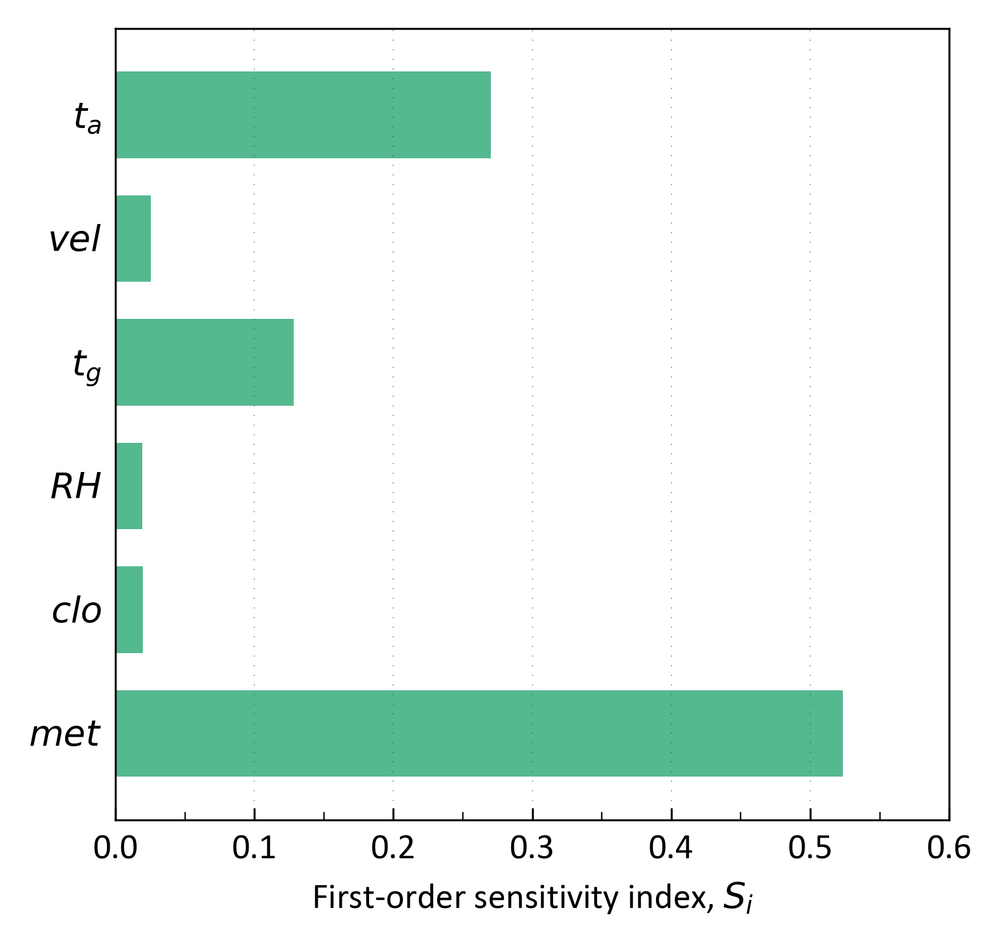

# Plot S1 index

In [82]:
# constants
title_n = 0
label_n = 0
abc_n = 0
spacing = 1

#  dmpl default style
dm.use_dmpl_style()

# figure size
fig = plt.figure(figsize=(dm.cm2in(8.5), dm.cm2in(7.6)))

# offset
# offset = dm.make_offset(5, -5, fig)
# offset2 = dm.make_offset(5 + dm.fs(0) + spacing, -5 + 0.5 * (title_n), fig)

# grid specification 
n_row = 1; n_col = 1
gs = fig.add_gridspec(n_row, n_col, 
                      left=0.07, right=0.98, bottom=0.0, top=0.99, 
                      wspace=0.0, hspace=0.0,
)

# axis
ax = fig.add_subplot(gs[0, 0])

# position for bar plot
y_pos = np.arange(len(var_name))

# plot bar chart
ax.barh(y_pos, S1.iloc[:,0], height=0.6, 
         tick_label=S1.index,                             
               xerr= S1_conf.iloc[:,0],                              
               error_kw=dict(lw=1, ecolor='None', capsize=2.5, capthick=0.5),
                             color='#55b98f', 
                             align='center')

# x label 
ax.set_xlabel('First-order sensitivity index, $S_i$')

# ytick label latex format
# ytick_label = ['$'+ i +'$' for i in var_name]  
ax.set_yticklabels(['$'+ i +'$' for i in var_name])


# xlim ylim 
ax.set_xlim(0, 0.42)
ymargin = 0.6
ax.set_ylim(-ymargin, len(var_name)-1 + ymargin)

# xticks
ax.xaxis.set_major_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(0.05))

# yticks off
ax.tick_params(axis='y', which='both',length=0)

# invert y axis order, should be after setting ylim   
ax.invert_yaxis()  

# grid
ax.set_axisbelow(True)  # grid below the bar
ax.grid(axis="x")

# show
result = dm.simple_layout(fig)
dm.save_and_show(fig)

Grid spec parameters: [0.05 0.95 0.05 0.95] Loss 0.008401648637824909
[ 15.          15.         973.93700787 867.63779528]
Grid spec parameters: [0.05000001 0.95       0.05       0.95      ] Loss 0.008401647575042644
[ 15.          15.         973.93700787 867.63779528]
Grid spec parameters: [0.05       0.95000001 0.05       0.95      ] Loss 0.008401648818628005
[ 15.          15.         973.93700787 867.63779528]
Grid spec parameters: [0.05       0.95       0.05000001 0.95      ] Loss 0.008401646479842664
[ 15.          15.         973.93700787 867.63779528]
Grid spec parameters: [0.05       0.95       0.05       0.95000001] Loss 0.008401649383921505
[ 15.          15.         973.93700787 867.63779528]
Grid spec parameters: [0.1        0.93191969 0.1        0.9       ] Loss 0.007875372722659
[ 15.          15.         973.93700787 867.63779528]
Grid spec parameters: [0.09999999 0.93191969 0.1        0.9       ] Loss 0.007875371423835474
[ 15.          15.         973.93700787 867.6

In [73]:
dm.save_formats(fig, './figure/First-order sensitivity index')

In [28]:

#%% Si bar horizontal chart with 95%CI, measured met
xtick_decimal = ['1','1','1','0','0']
ytick_decimal = ['0','0','0','1','1']
xmin = [0, 0, 0]
xmax = [0.6]*3
xint = [0.1]*3
xmar = [0.1]*3

ymin = [0, 0, 0]
ymax = [len(var_name)-1, len(var_name)-1, len(var_name)-1]
yint = [1, 1, 1]
ymar = [0.7]*3



In [ ]:

# colormap
# cmap = sns.cubehelix_palette(8, start=.5, rot=-.75, reverse=False)
cmap = sns.color_palette("BuGn_r", 8)

# position for bar plot
y_pos = np.arange(len(var_name))
nfig_row = 1; nfig_col = 1
fig, axe = plt.subplots(nfig_row, nfig_col, sharex=False, sharey=False, figsize=(cm2in(8.5),cm2in(8)), 
                                facecolor='w', edgecolor='k', squeeze=False)

# plot
axe[0, 0].barh(y_pos, S1.iloc[:,0], height=0.7, 
               tick_label=S1.index,                             
               xerr= S1_conf.iloc[:,0],                              
               error_kw=dict(lw=1, ecolor='None', capsize=2.5, capthick=0.5),
                             color=cmap[3], align='center')



# title 
# axe[0,0].set_title(f'SI_{file_suffix}', fontsize=fs)
for ridx in range(nfig_row):
    for cidx in range(nfig_col):   
        # figure index 
        idx = nfig_col*ridx + cidx
        print(idx)
        # zero guide line 
        # ax.plot([0,0], [-1,3], c='k', lw=lw[3])    # x=0
        
        # x label 
        axe[ridx,cidx].set_xlabel(f'{xlabel[0]}', fontsize=fs)
        
        # y tick label
        axe[ridx,cidx].set_yticklabels(ylabel)
        
        # tick customize 
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='major', width=0.5)
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='minor', width=0.35)
        
        # xlim ylim 
        axe[ridx,cidx].set_xlim(xmin[idx], xmax[idx])
        axe[ridx,cidx].set_ylim(ymin[idx]-ymar[idx], ymax[idx]+ymar[idx])
        # axe[ridx,cidx].margins(x=0, y=0.1)
        
        # invert y axis order 
        ax.invert_yaxis()  
        
        # tick decimal
        # axe[ridx,cidx].xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+xtick_decimal[idx]+'f'))
        # axe[ridx,cidx].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[idx]+'f'))
        
        # number of minor ticks
        axe[ridx,cidx].xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        axe[ridx,cidx].yaxis.set_minor_locator(ticker.AutoMinorLocator(1))
        
        # tick off 
        axe[ridx,cidx].tick_params(axis='y', which='both',length=0)
        
        # tick_params(axis=u'both', which=u'both',length=0)
        
        # grid 
#         grid line clipping https://matplotlib.org/users/dflt_style_changes.html#plot
        axe[ridx,cidx].grid(True, axis='x', linestyle='--', linewidth=lw[1], color='0.25');    
        
        # subplot annotation, https://matplotlib.org/gallery/text_labels_and_annotations/annotation_demo.html 
        # subplot_idx = '('+subplot_no[2*ridx+cidx]+')'
        # subplot_idx = f'({subplot_no[idx]})'
        # axe[ridx,cidx].annotate(subplot_idx, xy=(.005, 1.065), xycoords='axes fraction',
        #                         horizontalalignment='left', verticalalignment='top', fontsize=fs) 
        
        # axe[ridx,cidx].set_aspect('auto', adjustable=None, anchor=None, share=False)
       
        # spine line width  
        for k in ['top','bottom','left','right']:
                axe[ridx,cidx].spines[k].set_visible(True)
                axe[ridx,cidx].spines[k].set_linewidth(0.5)
                axe[ridx,cidx].spines[k].set_color('k')  


fig.align_labels()
fig.tight_layout(pad = 0.18)
plt.subplots_adjust(hspace = 0.20, wspace = 0.1)   

my_path = './plot/'
figname = f'Fig1_Bar_horizontal_plot_Si_measured'
plt.savefig(my_path+figname+'.png', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.svg', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.eps', dpi=600)


0


meta NOT subset; don't know how to subset; dropped


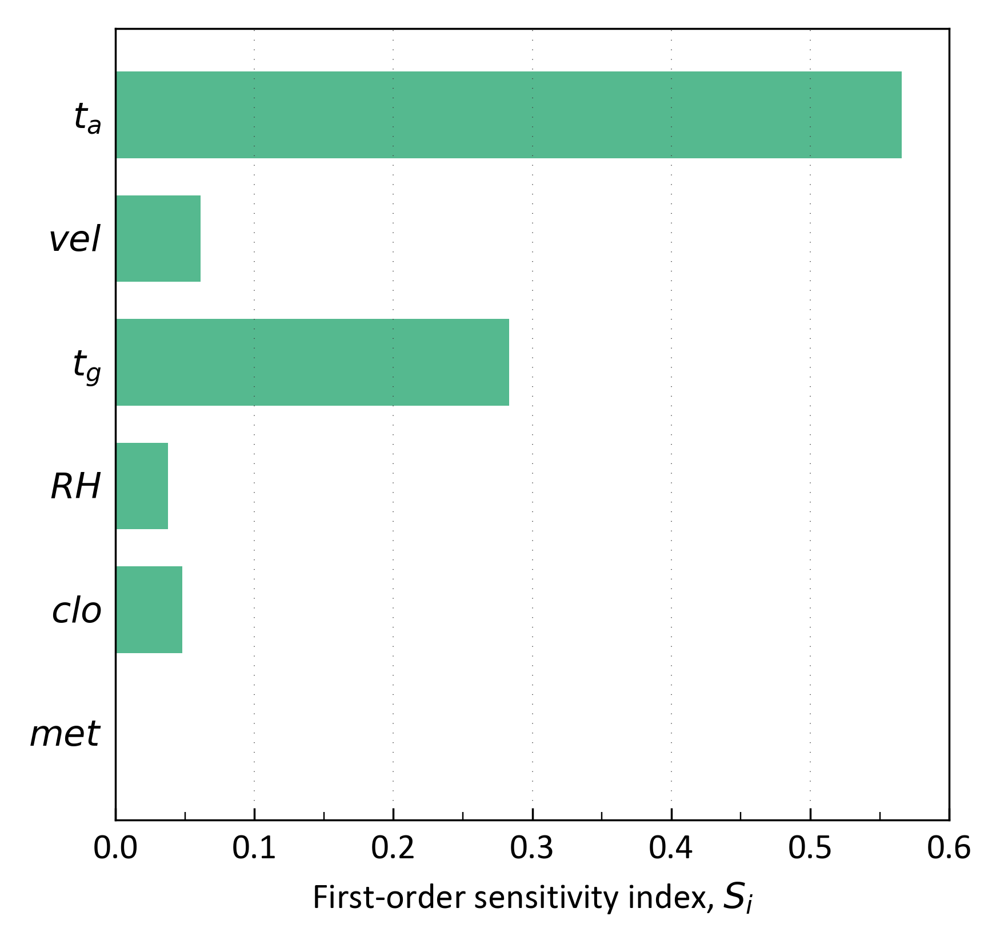

In [7]:
#%% Si bar horizontal chart with 95%CI, fixed PMV
xtick_decimal = ['1','1','1','0','0']
ytick_decimal = ['0','0','0','1','1']
xmin = [0, 0, 0]
xmax = [0.6]*3
xint = [0.1]*3
xmar = [0.1]*3

ymin = [0, 0, 0]
ymax = [len(var_name)-1, len(var_name)-1, len(var_name)-1]
yint = [1, 1, 1]
ymar = [0.7]*3

xlabel = ['First-order sensitivity index, $S_i$','First-order SI, $S_i$'] 
ylabel = ['$'+i+ '$' for i in var_name]   # flip

# colormap
# cmap = sns.cubehelix_palette(8, start=.5, rot=-.75, reverse=False)
cmap = sns.color_palette("BuGn_r", 8)

# position for bar plot
y_pos = np.arange(len(var_name))
nfig_row = 1; nfig_col = 1
fig, axe = plt.subplots(nfig_row, nfig_col, sharex=False, sharey=False, figsize=(cm2in(8.5),cm2in(8)), 
                                facecolor='w', edgecolor='k', squeeze=False)

# plot
axe[0, 0].barh(y_pos, S1_2.iloc[:,0], height=0.7, 
               tick_label=S1.index,                             
               xerr= S1_conf.iloc[:,0],                              
               error_kw=dict(lw=1, ecolor='None', capsize=2.5, capthick=0.5),
                             color=cmap[3], align='center')



# title 
# axe[0,0].set_title(f'SI_{file_suffix}', fontsize=fs)
for ridx in range(nfig_row):
    for cidx in range(nfig_col):   
        # figure index 
        idx = nfig_col*ridx + cidx
        print(idx)
        # zero guide line 
        # axe[ridx, cidx].plot([0,0], [-1,3], c='k', lw=lw[3])    # x=0
        
        # x label 
        axe[ridx,cidx].set_xlabel(f'{xlabel[0]}', fontsize=fs)
        
        # y tick label
        axe[ridx,cidx].set_yticklabels(ylabel)
        
        # tick customize 
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='major', width=0.5)
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='minor', width=0.35)
        
        # xlim ylim 
        axe[ridx,cidx].set_xlim(xmin[idx], xmax[idx])
        axe[ridx,cidx].set_ylim(ymin[idx]-ymar[idx], ymax[idx]+ymar[idx])
        # axe[ridx,cidx].margins(x=0, y=0.1)
        
        # invert y axis order 
        axe[ridx, cidx].invert_yaxis()  
        
        # tick decimal
        # axe[ridx,cidx].xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+xtick_decimal[idx]+'f'))
        # axe[ridx,cidx].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[idx]+'f'))
        
        # number of minor ticks
        axe[ridx,cidx].xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        axe[ridx,cidx].yaxis.set_minor_locator(ticker.AutoMinorLocator(1))
        
        # tick off 
        axe[ridx,cidx].tick_params(axis='y', which='both',length=0)
        
        # tick_params(axis=u'both', which=u'both',length=0)
        
        # grid 
#         grid line clipping https://matplotlib.org/users/dflt_style_changes.html#plot
        axe[ridx,cidx].grid(True, axis='x', linestyle='--', linewidth=lw[1], color='0.25');    
        
        # subplot annotation, https://matplotlib.org/gallery/text_labels_and_annotations/annotation_demo.html 
        # subplot_idx = '('+subplot_no[2*ridx+cidx]+')'
        # subplot_idx = f'({subplot_no[idx]})'
        # axe[ridx,cidx].annotate(subplot_idx, xy=(.005, 1.065), xycoords='axes fraction',
        #                         horizontalalignment='left', verticalalignment='top', fontsize=fs) 
        
        # axe[ridx,cidx].set_aspect('auto', adjustable=None, anchor=None, share=False)
       
        # spine line width  
        for k in ['top','bottom','left','right']:
                axe[ridx,cidx].spines[k].set_visible(True)
                axe[ridx,cidx].spines[k].set_linewidth(0.5)
                axe[ridx,cidx].spines[k].set_color('k')  


fig.align_labels()
fig.tight_layout(pad = 0.18)
plt.subplots_adjust(hspace = 0.20, wspace = 0.1)   

my_path = './plot/'
figname = f'Fig1_Bar_horizontal_plot_Si_fixed'
plt.savefig(my_path+figname+'.png', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.svg', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.eps', dpi=600)




0


meta NOT subset; don't know how to subset; dropped


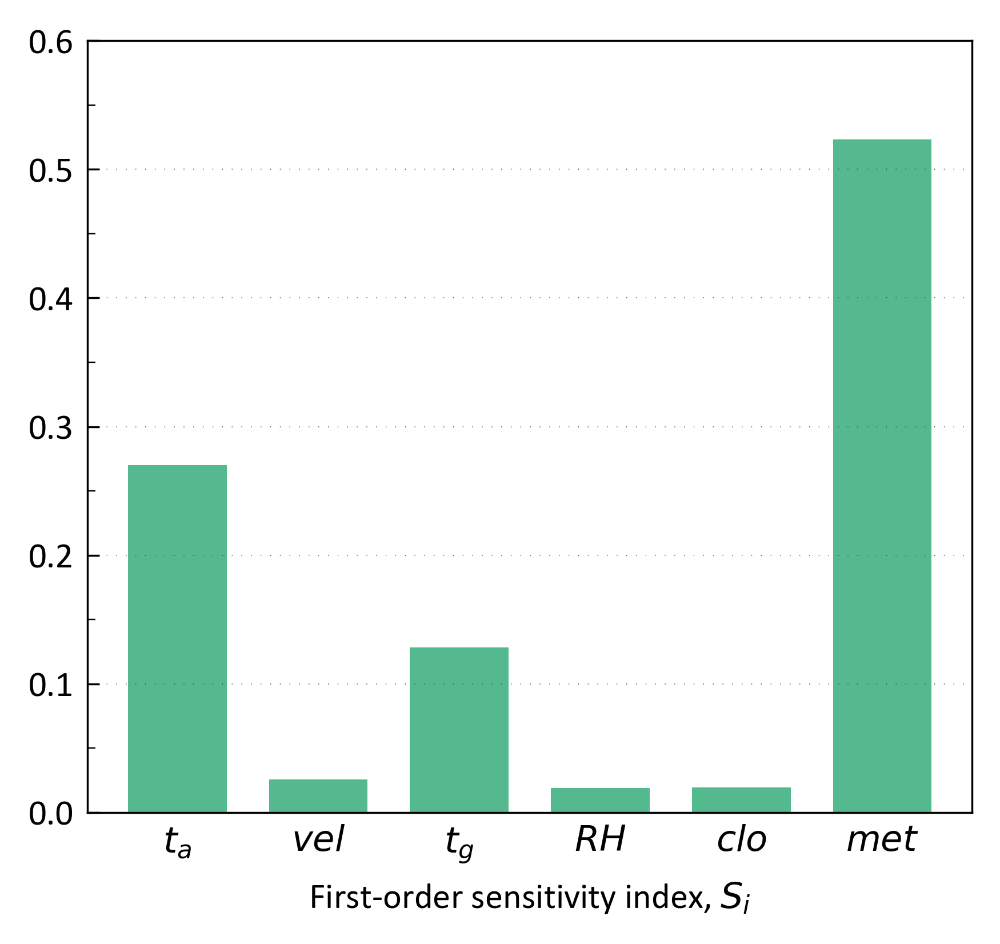

In [8]:
#%% Si bar vertical chart with 95%CI, measured PMV
xtick_decimal = ['1','1','1','0','0']
ytick_decimal = ['0','0','0','1','1']


xmin = [0, 0, 0]
xmax = [len(var_name)-1, len(var_name)-1, len(var_name)-1]
xint = [1, 1, 1]
xmar = [0.35]*3

ymin = [0, 0, 0]
ymax = [0.6]*3
yint = [0.1]*3
ymar = [0.0]*3

xlabel = ['$'+i+ '$' for i in var_name]   # flip
ylabel = ['First-order sensitivity index, $S_i$','First-order SI, $S_i$'] 


# colormap
# cmap = sns.cubehelix_palette(8, start=.5, rot=-.75, reverse=False)
cmap = sns.color_palette("BuGn_r", 8)

# position for bar plot
pos = np.arange(len(var_name))
nfig_row = 1; nfig_col = 1
fig, axe = plt.subplots(nfig_row, nfig_col, sharex=False, sharey=False, figsize=(cm2in(8.5),cm2in(8)), 
                                facecolor='w', edgecolor='k', squeeze=False)

# plot
axe[0, 0].bar(pos, S1.iloc[:,0], width=0.7, 
               tick_label=S1.index,                             
               yerr= S1_conf.iloc[:,0],                              
               error_kw=dict(lw=1, ecolor='None', capsize=2.0, capthick=0.5),
                             color=cmap[3], align='center')


# title 
# axe[0,0].set_title(f'SI_{file_suffix}', fontsize=fs)
for ridx in range(nfig_row):
    for cidx in range(nfig_col):   
        # figure index 
        idx = nfig_col*ridx + cidx
        print(idx)
        # zero guide line 
        # axe[ridx, cidx].plot([0,0], [-1,3], c='k', lw=lw[3])    # x=0
        
        # y label 
        axe[ridx,cidx].set_xlabel(f'{ylabel[0]}', fontsize=fs)
        
        # x tick label
        axe[ridx,cidx].set_xticklabels(xlabel)
        
        # tick customize 
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='major', width=0.5)
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='minor', width=0.35)
        
        # xlim ylim 
        # axe[ridx,cidx].set_xlim(xmin[idx]-xmar[idx], xmax[idx]+xmar[idx])
        axe[ridx,cidx].set_ylim(ymin[idx]-ymar[idx], ymax[idx]+ymar[idx])
        # axe[ridx,cidx].margins(x=0, y=0.1)
        
        # invert y axis order 
        # axe[ridx, cidx].invert_yaxis()  
        
        # tick decimal
        # axe[ridx,cidx].xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+xtick_decimal[idx]+'f'))
        # axe[ridx,cidx].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[idx]+'f'))
        
        # number of minor ticks
        axe[ridx,cidx].xaxis.set_minor_locator(ticker.AutoMinorLocator(1))
        axe[ridx,cidx].yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        
        # tick off 
        axe[ridx,cidx].tick_params(axis='x', which='both',length=0)
        
        # tick_params(axis=u'both', which=u'both',length=0)
        
        # grid 
#         grid line clipping https://matplotlib.org/users/dflt_style_changes.html#plot
        axe[ridx,cidx].grid(True, axis='y', linestyle='--', linewidth=lw[1], color='0.25');    
        
        # subplot annotation, https://matplotlib.org/gallery/text_labels_and_annotations/annotation_demo.html 
        # subplot_idx = '('+subplot_no[2*ridx+cidx]+')'
        # subplot_idx = f'({subplot_no[idx]})'
        # axe[ridx,cidx].annotate(subplot_idx, xy=(.005, 1.065), xycoords='axes fraction',
        #                         horizontalalignment='left', verticalalignment='top', fontsize=fs) 
        
        # axe[ridx,cidx].set_aspect('auto', adjustable=None, anchor=None, share=False)
       
        # spine line width  
        for k in ['top','bottom','left','right']:
                axe[ridx,cidx].spines[k].set_visible(True)
                axe[ridx,cidx].spines[k].set_linewidth(0.5)
                axe[ridx,cidx].spines[k].set_color('k')  


fig.align_labels()
fig.tight_layout(pad = 0.18)
plt.subplots_adjust(hspace = 0.20, wspace = 0.1)   

my_path = './plot/'
figname = f'Fig1_Bar_vertical plot_Si_measured'
plt.savefig(my_path+figname+'.png', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.svg', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.eps', dpi=600)


0


meta NOT subset; don't know how to subset; dropped


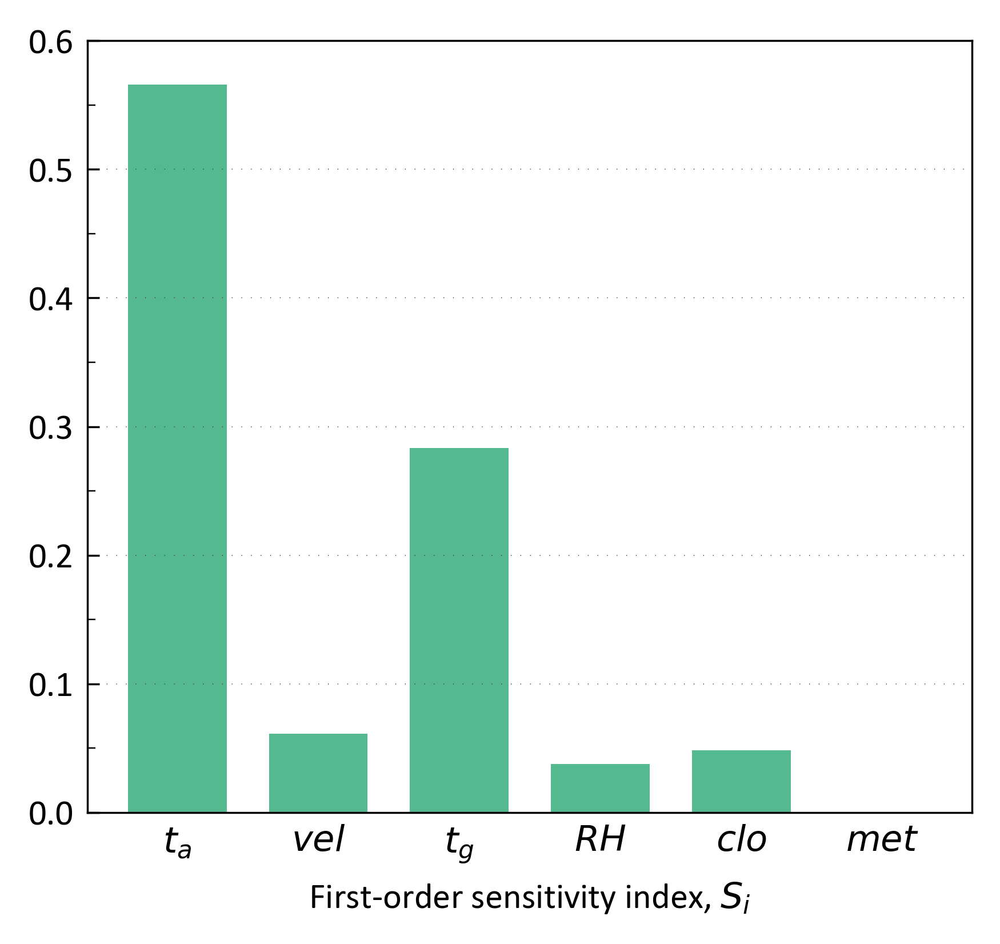

In [9]:
#%% Si bar vertical chart with 95%CI, fixed met
xtick_decimal = ['1','1','1','0','0']
ytick_decimal = ['0','0','0','1','1']


xmin = [0, 0, 0]
xmax = [len(var_name)-1, len(var_name)-1, len(var_name)-1]
xint = [1, 1, 1]
xmar = [0.35]*3

ymin = [0, 0, 0]
ymax = [0.6]*3
yint = [0.1]*3
ymar = [0.0]*3

xlabel = ['$'+i+ '$' for i in var_name]   # flip
ylabel = ['First-order sensitivity index, $S_i$','First-order SI, $S_i$'] 


# colormap
# cmap = sns.cubehelix_palette(8, start=.5, rot=-.75, reverse=False)
cmap = sns.color_palette("BuGn_r", 8)

# position for bar plot
pos = np.arange(len(var_name))
nfig_row = 1; nfig_col = 1
fig, axe = plt.subplots(nfig_row, nfig_col, sharex=False, sharey=False, figsize=(cm2in(8.5),cm2in(8)), 
                                facecolor='w', edgecolor='k', squeeze=False)

# plot
axe[0, 0].bar(pos, S1_2.iloc[:,0], width=0.7, 
               tick_label=S1.index,                             
               yerr= S1_conf.iloc[:,0],                              
               error_kw=dict(lw=1, ecolor='None', capsize=2.0, capthick=0.5),
                             color=cmap[3], align='center')


# title 
# axe[0,0].set_title(f'SI_{file_suffix}', fontsize=fs)
for ridx in range(nfig_row):
    for cidx in range(nfig_col):   
        # figure index 
        idx = nfig_col*ridx + cidx
        print(idx)
        # zero guide line 
        # axe[ridx, cidx].plot([0,0], [-1,3], c='k', lw=lw[3])    # x=0
        
        # y label 
        axe[ridx,cidx].set_xlabel(f'{ylabel[0]}', fontsize=fs)
        
        # x tick label
        axe[ridx,cidx].set_xticklabels(xlabel)
        
        # tick customize 
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='major', width=0.5)
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='minor', width=0.35)
        
        # xlim ylim 
        # axe[ridx,cidx].set_xlim(xmin[idx]-xmar[idx], xmax[idx]+xmar[idx])
        axe[ridx,cidx].set_ylim(ymin[idx]-ymar[idx], ymax[idx]+ymar[idx])
        # axe[ridx,cidx].margins(x=0, y=0.1)
        
        # invert y axis order 
        # axe[ridx, cidx].invert_yaxis()  
        
        # tick decimal
        # axe[ridx,cidx].xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+xtick_decimal[idx]+'f'))
        # axe[ridx,cidx].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[idx]+'f'))
        
        # number of minor ticks
        axe[ridx,cidx].xaxis.set_minor_locator(ticker.AutoMinorLocator(1))
        axe[ridx,cidx].yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        
        # tick off 
        axe[ridx,cidx].tick_params(axis='x', which='both',length=0)
        
        # tick_params(axis=u'both', which=u'both',length=0)
        
        # grid 
#         grid line clipping https://matplotlib.org/users/dflt_style_changes.html#plot
        axe[ridx,cidx].grid(True, axis='y', linestyle='--', linewidth=lw[1], color='0.25');    
        
        # subplot annotation, https://matplotlib.org/gallery/text_labels_and_annotations/annotation_demo.html 
        # subplot_idx = '('+subplot_no[2*ridx+cidx]+')'
        # subplot_idx = f'({subplot_no[idx]})'
        # axe[ridx,cidx].annotate(subplot_idx, xy=(.005, 1.065), xycoords='axes fraction',
        #                         horizontalalignment='left', verticalalignment='top', fontsize=fs) 
        
        # axe[ridx,cidx].set_aspect('auto', adjustable=None, anchor=None, share=False)
       
        # spine line width  
        for k in ['top','bottom','left','right']:
                axe[ridx,cidx].spines[k].set_visible(True)
                axe[ridx,cidx].spines[k].set_linewidth(0.5)
                axe[ridx,cidx].spines[k].set_color('k')  


fig.align_labels()
fig.tight_layout(pad = 0.18)
plt.subplots_adjust(hspace = 0.20, wspace = 0.1)   

my_path = './plot/'
figname = f'Fig1_Bar_vertical plot_Si_fixed'
plt.savefig(my_path+figname+'.png', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.svg', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.eps', dpi=600)




0


meta NOT subset; don't know how to subset; dropped


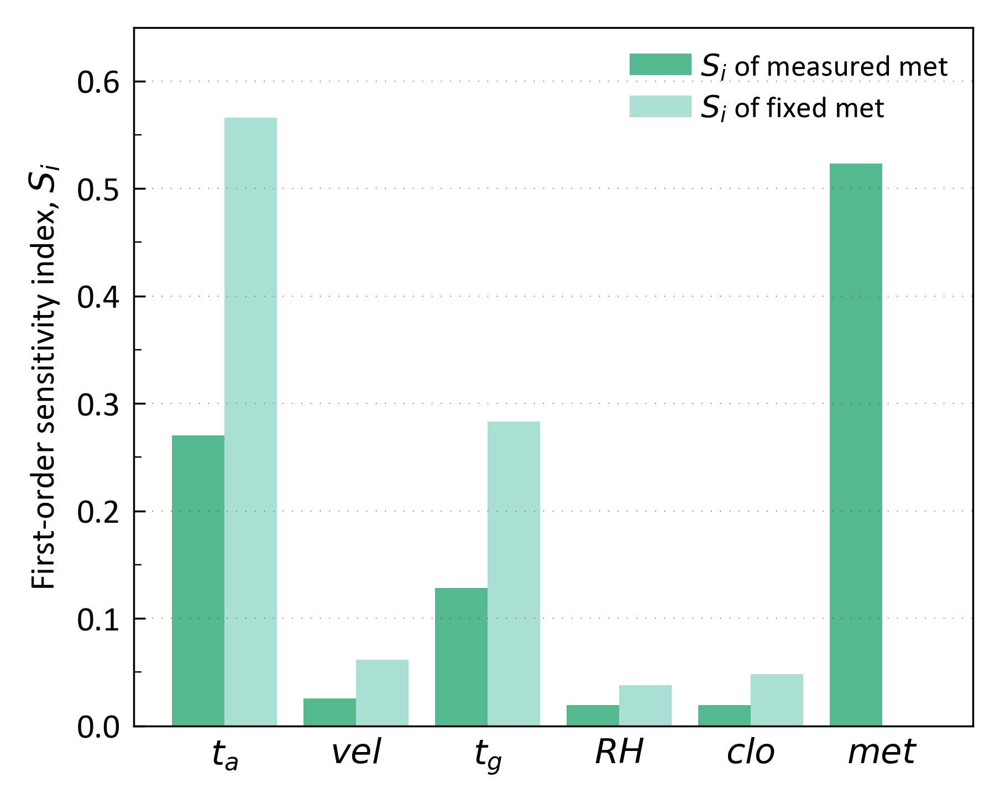

In [10]:
#%% Si bar vertical chart with 95%CI, simultaneous comparison
xtick_decimal = ['1','1','1','0','0']
ytick_decimal = ['0','0','0','1','1']


xmin = [0, 0, 0]
xmax = [len(var_name)-1, len(var_name)-1, len(var_name)-1]
xint = [1, 1, 1]
xmar = [0.35]*3

ymin = [0, 0, 0]
ymax = [0.65]*3
yint = [0.1]*3
ymar = [0.0]*3

xlabel = ['$'+i+ '$' for i in var_name]   # flip
ylabel = ['First-order sensitivity index, $S_i$','First-order SI, $S_i$'] 


# colormap
# cmap = sns.cubehelix_palette(5, start=.5, rot=-.75, reverse=False)
cmap = sns.color_palette("BuGn_r", 8)

# position for bar plot
pos = np.arange(len(var_name)) +1 
nfig_row = 1; nfig_col = 1
fig, axe = plt.subplots(nfig_row, nfig_col, sharex=False, sharey=False, figsize=(cm2in(8.8),cm2in(7.0)), 
                                facecolor='w', edgecolor='k', squeeze=False)

bar_width = 0.4

# plot
b1 = axe[0, 0].bar(pos - bar_width/2 , S1.iloc[:,0], width=bar_width, 
                tick_label=S1.index,                             
                color=cmap[3], align='edge',
                label='$S_i$ of measured met')

b2 = axe[0, 0].bar(pos + bar_width/2, S1_2.iloc[:,0], width=bar_width, 
                tick_label=S1.index,                             
                color=cmap[5], align='edge',
                label='$S_i$ of fixed met')



# title 
# axe[0,0].set_title(f'SI_{file_suffix}', fontsize=fs)
for ridx in range(nfig_row):
    for cidx in range(nfig_col):   
        # figure index 
        idx = nfig_col*ridx + cidx
        print(idx)
        
        # zero guide line 
        # axe[ridx, cidx].plot([0,0], [-1,3], c='k', lw=lw[3])    # x=0
        
        # y label 
        axe[ridx,cidx].set_ylabel(f'{ylabel[0]}', fontsize=fs)
        
        # x tick label
        axe[ridx,cidx].set_xticklabels(xlabel)
        
        # tick customize 
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='major', width=0.5)
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='minor', width=0.35)
        
        # xlim ylim 
        # axe[ridx,cidx].set_xlim(xmin[idx]-xmar[idx], xmax[idx]+xmar[idx])
        axe[ridx,cidx].set_ylim(ymin[idx]-ymar[idx], ymax[idx]+ymar[idx])
        # axe[ridx,cidx].margins(x=0, y=0.1)
        
        # invert y axis order 
        # axe[ridx, cidx].invert_yaxis()  
        
        # tick decimal
        # axe[ridx,cidx].xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+xtick_decimal[idx]+'f'))
        # axe[ridx,cidx].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[idx]+'f'))
        
        # number of minor ticks
        axe[ridx,cidx].xaxis.set_minor_locator(ticker.AutoMinorLocator(1))
        axe[ridx,cidx].yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        
        # tick off 
        axe[ridx,cidx].tick_params(axis='x', which='both',length=0)
        
        # tick_params(axis=u'both', which=u'both',length=0)
        
        
        # legend 
        handles, labels = axe[ridx,cidx].get_legend_handles_labels()
        legorder1 = range(len(handles))
        axe[ridx,cidx].legend([handles[idx] for idx in legorder1],
                              [labels[idx] for idx in legorder1], 
                              loc='upper right', ncol=1, bbox_to_anchor=None, frameon=False, 
                              edgecolor='None', facecolor='None',
                              fontsize=leg_fs, fancybox=False, 
                              columnspacing= 1.05, labelspacing=0.4)  
        
        # grid 
#         grid line clipping https://matplotlib.org/users/dflt_style_changes.html#plot
        axe[ridx,cidx].grid(True, axis='y', linestyle='--', linewidth=lw[1], color='0.25') 
 
 
        # subplot annotation, https://matplotlib.org/gallery/text_labels_and_annotations/annotation_demo.html 
        # subplot_idx = '('+subplot_no[2*ridx+cidx]+')'
        # subplot_idx = f'({subplot_no[idx]})'
        # axe[ridx,cidx].annotate(subplot_idx, xy=(.005, 1.065), xycoords='axes fraction',
        #                         horizontalalignment='left', verticalalignment='top', fontsize=fs) 
        
        # axe[ridx,cidx].set_aspect('auto', adjustable=None, anchor=None, share=False)
       
        # spine line width  
        for k in ['top','bottom','left','right']:
                axe[ridx,cidx].spines[k].set_visible(True)
                axe[ridx,cidx].spines[k].set_linewidth(0.5)
                axe[ridx,cidx].spines[k].set_color('k')  


fig.align_labels()
fig.tight_layout(pad = 0.18)
plt.subplots_adjust(hspace = 0.20, wspace = 0.1)   

my_path = './plot/'
figname = f'Fig1_Bar_vertical plot_Si_Comparison'
plt.savefig(my_path+figname+'.png', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.svg', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.eps', dpi=600)



meta NOT subset; don't know how to subset; dropped


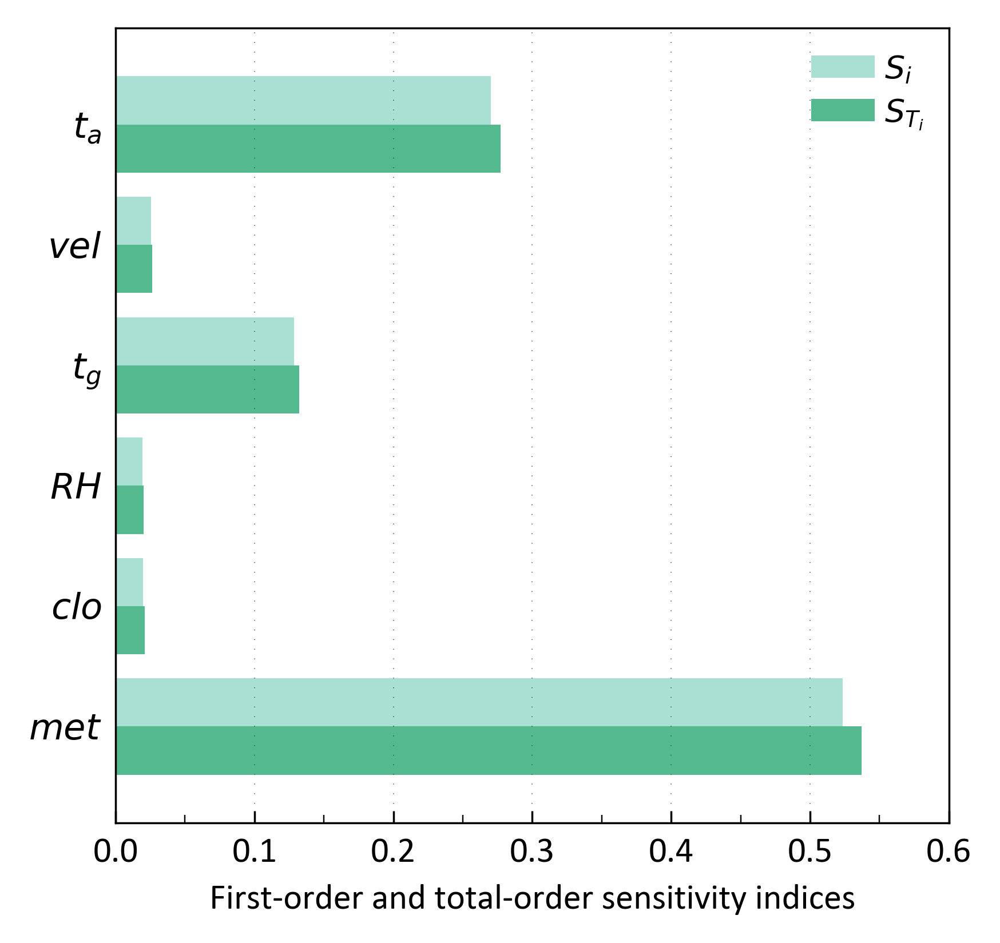

In [11]:
#%% Si and ST bar stacked measured
xtick_decimal = ['1','1','1','0','0']
ytick_decimal = ['0','0','0','1','1']
xmin = [0, 0, 0]
xmax = [0.6]*3
xint = [0.1, 0.1, 0.1]
xmar = [0.08]*3

ymin = [0, 0, 0]
ymax = [len(var_name)-1, len(var_name)-1, len(var_name)-1]
yint = [1, 1, 1]
ymar = [0.8]*3

xlabel = ['First-order and total-order sensitivity indices'] 
ylabel = ['$'+i+ '$' for i in var_name]   # flip

# colormap
# cmap = sns.cubehelix_palette(8, start=.5, rot=-.75, reverse=False)
cmap = sns.color_palette("BuGn_r", 8)

# position for bar plot
nfig_row = 1; nfig_col = int(len(xlabel)/nfig_row)
fig, axe = plt.subplots(nfig_row, nfig_col, sharex=False, sharey=False, figsize=(cm2in(8.5),cm2in(8)), 
                                facecolor='w', edgecolor='k', squeeze=False)

# plot 
y_pos = np.arange(len(var_name))
height = 0.4    # bar height 
b1 = axe[0, 0].barh(y_pos - height/2, S1.iloc[:,0], 
                    height=height, label='$S_i$', 
                    tick_label=S1.index, 
                    color=cmap[5], align='center')

b2 = axe[0, 0].barh(y_pos + height/2, ST.iloc[:,0], 
                    height=height, label='$S_{T_i}$', 
                    tick_label=ST.index,
                    color=cmap[3], align='center')

# title 
# axe[0,0].set_title(f'First and total SIs_{file_suffix}', fontsize=fs)

# move ytick position 
axe[0, 0].yaxis.set(ticks=y_pos, ticklabels=ylabel) 

for ridx in range(nfig_row):
    for cidx in range(nfig_col):   
        # figure index 
        idx = nfig_col*ridx + cidx
        
        # zero guide line 
        # axe[ridx, cidx].plot([0,0], [-1,3], c='k', lw=lw[3])    # x=0
        
        # x label 
        axe[ridx,cidx].set_xlabel(f'{xlabel[idx]}', fontsize=fs)
        
        # y tick label
        axe[ridx,cidx].set_yticklabels(ylabel)
        
        # tick customize 
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='major', width=0.5)
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='minor', width=0.35)
        
        # xlim ylim 
        axe[ridx,cidx].set_xlim(xmin[idx], xmax[idx])
        axe[ridx,cidx].set_ylim(ymin[idx]-ymar[idx], ymax[idx]+ymar[idx])
        # axe[ridx,cidx].margins(x=0, y=0.1)
        
        # invert y axis order 
        axe[ridx, cidx].invert_yaxis()  
        
        # tick decimal
        # axe[ridx,cidx].xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+xtick_decimal[idx]+'f'))
        # axe[ridx,cidx].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[idx]+'f'))
        
        # number of minor ticks
        axe[ridx,cidx].xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        axe[ridx,cidx].yaxis.set_minor_locator(ticker.AutoMinorLocator(1))
        
        # tick off 
        axe[ridx,cidx].tick_params(axis='y', which='both',length=0)
        
        # tick_params(axis=u'both', which=u'both',length=0)
        
        # grid 
#         grid line clipping https://matplotlib.org/users/dflt_style_changes.html#plot
        axe[ridx,cidx].grid(True, axis='x', linestyle='--', linewidth=lw[1], color='0.25');    
        
        # legend 
        handles, labels = axe[ridx,cidx].get_legend_handles_labels()
        legorder1 = range(len(handles))
        axe[ridx,cidx].legend([handles[idx] for idx in legorder1],
                              [labels[idx] for idx in legorder1], 
                              loc='best', ncol=1, bbox_to_anchor=None, frameon=False, 
                              edgecolor='None', facecolor='None',
                              fontsize=leg_fs, fancybox=False, 
                              columnspacing= 1.05, labelspacing=0.4)
        
        # subplot annotation, https://matplotlib.org/gallery/text_labels_and_annotations/annotation_demo.html 
        # subplot_idx = '('+subplot_no[2*ridx+cidx]+')'
        # subplot_idx = f'({subplot_no[idx]})'
        # axe[ridx,cidx].annotate(subplot_idx, xy=(.017, 0.975), xycoords='axes fraction',
        #                         horizontalalignment='left', verticalalignment='top', fontsize=fs) 
        
        # axe[ridx,cidx].set_aspect('auto', adjustable=None, anchor=None, share=False)
       
        # spine line width  
        for k in ['top','bottom','left','right']:
                axe[ridx,cidx].spines[k].set_visible(True)
                axe[ridx,cidx].spines[k].set_linewidth(0.5)
                axe[ridx,cidx].spines[k].set_color('k')  


fig.align_labels()
fig.tight_layout(pad = 0.2)
plt.subplots_adjust(hspace = 0.20, wspace = 0.3)   

my_path = './plot/'
figname = f'Fig2_Bar_plot_Si_and_ST_measured'
plt.savefig(my_path+figname+'.png', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.svg', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.eps', dpi=600)


meta NOT subset; don't know how to subset; dropped


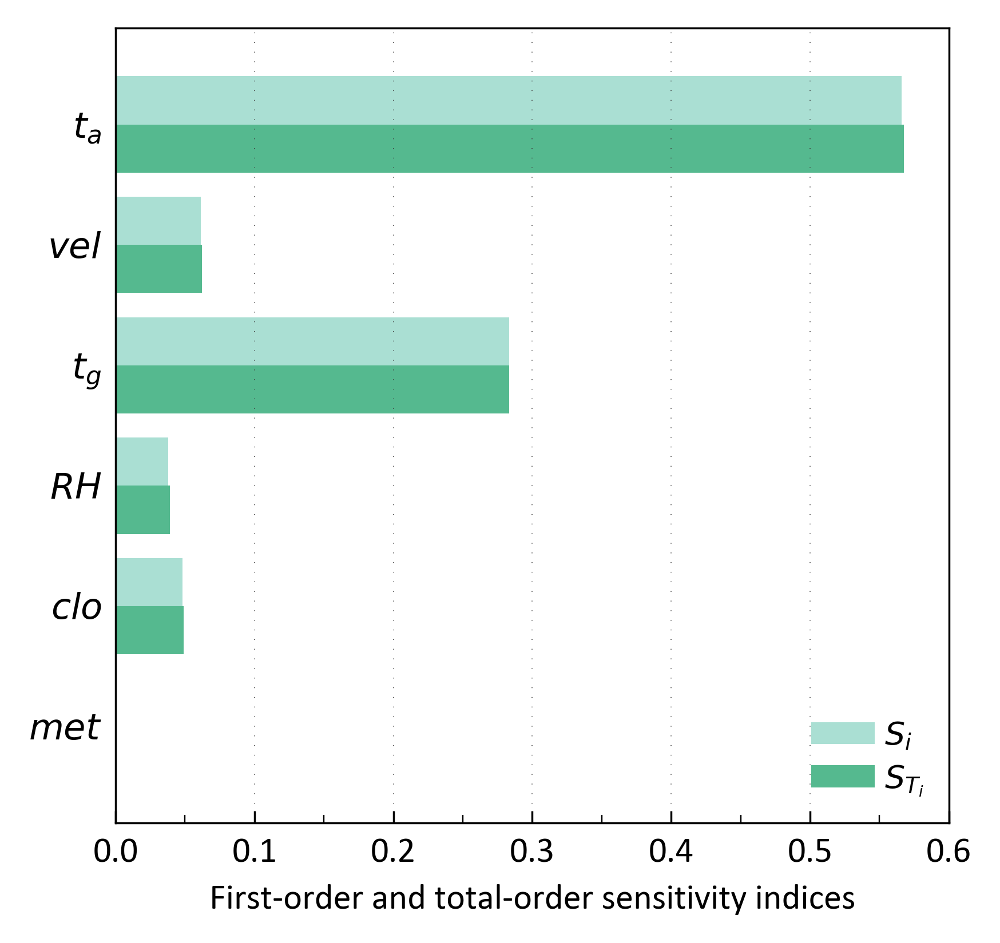

In [12]:
#%% Si and ST bar stacked fixed
xtick_decimal = ['1','1','1','0','0']
ytick_decimal = ['0','0','0','1','1']
xmin = [0, 0, 0]
xmax = [0.6]*3
xint = [0.1, 0.1, 0.1]
xmar = [0.08]*3

ymin = [0, 0, 0]
ymax = [len(var_name)-1, len(var_name)-1, len(var_name)-1]
yint = [1, 1, 1]
ymar = [0.8]*3

xlabel = ['First-order and total-order sensitivity indices'] 
ylabel = ['$'+i+ '$' for i in var_name]   # flip

# colormap
# cmap = sns.cubehelix_palette(8, start=.5, rot=-.75, reverse=False)
cmap = sns.color_palette("BuGn_r", 8)

# position for bar plot
nfig_row = 1; nfig_col = int(len(xlabel)/nfig_row)
fig, axe = plt.subplots(nfig_row, nfig_col, sharex=False, sharey=False, figsize=(cm2in(8.5),cm2in(8)), 
                                facecolor='w', edgecolor='k', squeeze=False)

# plot 
y_pos = np.arange(len(var_name))
height = 0.4    # bar height 
b1 = axe[0, 0].barh(y_pos - height/2, S1_2.iloc[:,0], 
                    height=height, label='$S_i$', 
                    tick_label=S1.index, 
                    color=cmap[5], align='center')

b2 = axe[0, 0].barh(y_pos + height/2, ST_2.iloc[:,0], 
                    height=height, label='$S_{T_i}$', 
                    tick_label=ST.index,
                    color=cmap[3], align='center')

# title 
# axe[0,0].set_title(f'First and total SIs_{file_suffix}', fontsize=fs)

# move ytick position 
axe[0, 0].yaxis.set(ticks=y_pos, ticklabels=ylabel) 

for ridx in range(nfig_row):
    for cidx in range(nfig_col):   
        # figure index 
        idx = nfig_col*ridx + cidx
        
        # zero guide line 
        # axe[ridx, cidx].plot([0,0], [-1,3], c='k', lw=lw[3])    # x=0
        
        # x label 
        axe[ridx,cidx].set_xlabel(f'{xlabel[idx]}', fontsize=fs)
        
        # y tick label
        axe[ridx,cidx].set_yticklabels(ylabel)
        
        # tick customize 
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='major', width=0.5)
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='minor', width=0.35)
        
        # xlim ylim 
        axe[ridx,cidx].set_xlim(xmin[idx], xmax[idx])
        axe[ridx,cidx].set_ylim(ymin[idx]-ymar[idx], ymax[idx]+ymar[idx])
        # axe[ridx,cidx].margins(x=0, y=0.1)
        
        # invert y axis order 
        axe[ridx, cidx].invert_yaxis()  
        
        # tick decimal
        # axe[ridx,cidx].xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+xtick_decimal[idx]+'f'))
        # axe[ridx,cidx].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[idx]+'f'))
        
        # number of minor ticks
        axe[ridx,cidx].xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        axe[ridx,cidx].yaxis.set_minor_locator(ticker.AutoMinorLocator(1))
        
        # tick off 
        axe[ridx,cidx].tick_params(axis='y', which='both',length=0)
        
        # tick_params(axis=u'both', which=u'both',length=0)
        
        # grid 
#         grid line clipping https://matplotlib.org/users/dflt_style_changes.html#plot
        axe[ridx,cidx].grid(True, axis='x', linestyle='--', linewidth=lw[1], color='0.25');    
        
        # legend 
        handles, labels = axe[ridx,cidx].get_legend_handles_labels()
        legorder1 = range(len(handles))
        axe[ridx,cidx].legend([handles[idx] for idx in legorder1],
                              [labels[idx] for idx in legorder1], 
                              loc='lower right', ncol=1, bbox_to_anchor=None, frameon=False, 
                              edgecolor='None', facecolor='None',
                              fontsize=leg_fs, fancybox=False, 
                              columnspacing= 1.05, labelspacing=0.4)
        
        # subplot annotation, https://matplotlib.org/gallery/text_labels_and_annotations/annotation_demo.html 
        # subplot_idx = '('+subplot_no[2*ridx+cidx]+')'
        # subplot_idx = f'({subplot_no[idx]})'
        # axe[ridx,cidx].annotate(subplot_idx, xy=(.017, 0.975), xycoords='axes fraction',
        #                         horizontalalignment='left', verticalalignment='top', fontsize=fs) 
        
        # axe[ridx,cidx].set_aspect('auto', adjustable=None, anchor=None, share=False)
       
        # spine line width  
        for k in ['top','bottom','left','right']:
                axe[ridx,cidx].spines[k].set_visible(True)
                axe[ridx,cidx].spines[k].set_linewidth(0.5)
                axe[ridx,cidx].spines[k].set_color('k')  


fig.align_labels()
fig.tight_layout(pad = 0.2)
plt.subplots_adjust(hspace = 0.20, wspace = 0.3)   

my_path = './plot/'
figname = f'Fig2_Bar_plot_Si_and_ST_fixed'
plt.savefig(my_path+figname+'.png', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.svg', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.eps', dpi=600)



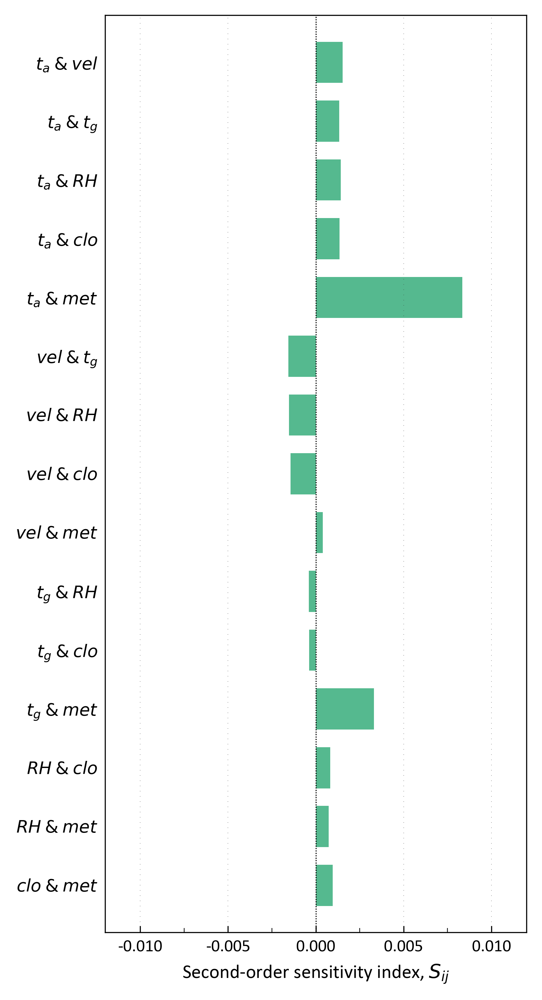

In [13]:
#%% S2 bar chart with 95%CI
xtick_decimal = ['3','2','2','0','0']
ytick_decimal = ['0','0','0','1','1']
xmin = [-0.01, -0.04, -0.14]
xmax = [0.01, 0.04, 0.40]
xint = [0.005, 0.2, 0.2]
xmar = [0.002, 0.1, 0.1]

ymin = [0, -0.7, -0.7]
ymax = [len(S2)-1, len(S2)-1, len(S2)-1]
yint = [1, 1, 1]
ymar = [0.8, 0.1, 0.1]

xlabel = ['Second-order sensitivity index, $S_{ij}$'] 
var_comb = S2.index.to_list()

# colormap
# cmap = sns.cubehelix_palette(8, start=.5, rot=-.75, reverse=False)
cmap = sns.color_palette("BuGn_r", 8)


# Get list of parameters and convert to latex str
var_name = S1.index.to_list()
var_name_latex = ['$'+i+'$' for i in var_name]   

# possible combinations of parameters using list(itertools.combinations(parameters, 2))
param_combs = [list(cen_p) for cen_p in list(itertools.combinations(var_name_latex, 2))]

# param_combs 는 list 안에 list가 있고 두 요소의 str이 들어가 있기 때문에, 이를 하나로 합치는 작업이 필요 
second_ticklabel = [param_combs[i][0]+' $&$ '+param_combs[i][1] for i in range(len(param_combs))]

# position of bars
y_pos = np.arange(len(param_combs))
nfig_row = 1; nfig_col = 1
fig, axe = plt.subplots(nfig_row, nfig_col, sharex=False, sharey=False, figsize=(cm2in(8.5),cm2in(16)), 
                                facecolor='w', edgecolor='k', squeeze=False)

# plot 
# axe[0, 0].barh(y_pos, S2.iloc[:,0], 
#                height=0.7, tick_label=second_ticklabel,
#                xerr= S2_conf.iloc[:,0], 
#                error_kw=dict(lw=1, ecolor='k', capsize=3.5, capthick=0.5),
#                color=cmap[3], align='center') 

axe[0, 0].barh(y_pos, S2.iloc[:,0], 
                height=0.7, tick_label=second_ticklabel,
                color=cmap[3], align='center')   

axe[0,0].vlines(0.0, -10, 70, 
                colors='k', linestyles=':', linewidth=0.5,
                label="" )

# title 
# axe[0,0].set_title(f'Second order SI_{file_suffix}', fontsize=fs)

for ridx in range(nfig_row):
    for cidx in range(nfig_col): 
        
        # figure index 
        idx = nfig_col*ridx + cidx
        
        # axe[ridx, cidx].plot([0,0], [-1,3], c='k', lw=lw[3])    # x=0
        
        axe[ridx,cidx].set_xlabel(f'{xlabel[idx]}', fontsize=fs)
        
        # tick customize 
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs-1, which='major', width=0.5)
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs-1, which='minor', width=0.35)
        
        # tick position 
        axe[ridx,cidx].set_xticks(np.arange(xmin[idx], xmax[idx]+xint[idx], xint[idx])) 
        # axe[ridx,cidx].set_yticks(np.arange(ymin[idx], ymax[idx]+yint[idx], yint[idx])) 
        
        # xlim ylim 
        axe[ridx,cidx].set_xlim(xmin[idx]-xmar[idx], xmax[idx]+xmar[idx])
        axe[ridx,cidx].set_ylim(ymin[idx]-ymar[idx], ymax[idx]+ymar[idx])
        
        # invert y axis
        axe[ridx, cidx].invert_yaxis()  
        
        # tick decimal
        axe[ridx,cidx].xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+xtick_decimal[idx]+'f'))
        # axe[ridx,cidx].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[idx]+'f'))
        
        # number of minor ticks
        axe[ridx,cidx].xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        axe[ridx,cidx].yaxis.set_minor_locator(ticker.AutoMinorLocator(1))
        
        # tick off 
        axe[ridx,cidx].tick_params(axis='y', which='both',length=0)
        
        # grid 
#         grid line clipping https://matplotlib.org/users/dflt_style_changes.html#plot
        axe[ridx,cidx].grid(True, axis='x', linestyle='--', linewidth=lw[1], color='0.25');    
        
        # subplot annotation, https://matplotlib.org/gallery/text_labels_and_annotations/annotation_demo.html 
        # subplot_idx = '('+subplot_no[2*ridx+cidx]+')'
        # subplot_idx = f'({subplot_no[idx]})'
        # axe[ridx,cidx].annotate(subplot_idx, xy=(.017, 0.975), xycoords='axes fraction',
        #                         horizontalalignment='left', verticalalignment='top', fontsize=fs) 
        
        # axe[ridx,cidx].set_aspect('auto', adjustable=None, anchor=None, share=False)
       
        # spine line width  
        for k in ['top','bottom','left','right']:
                axe[ridx,cidx].spines[k].set_visible(True)
                axe[ridx,cidx].spines[k].set_linewidth(0.5)
                axe[ridx,cidx].spines[k].set_color('k')  

fig.align_labels()
fig.tight_layout(pad = 0.2)
plt.subplots_adjust(hspace = 0.05, wspace = 0.3)   

my_path = './plot/'
figname = f'Fig3_Bar_plot_S2'
# plt.savefig(my_path+figname+'.png', dpi=600, transparent=True)
# plt.savefig(my_path+figname+'.svg', dpi=600, transparent=True)
# plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)
# plt.savefig(my_path+figname+'.eps', dpi=600)


meta NOT subset; don't know how to subset; dropped


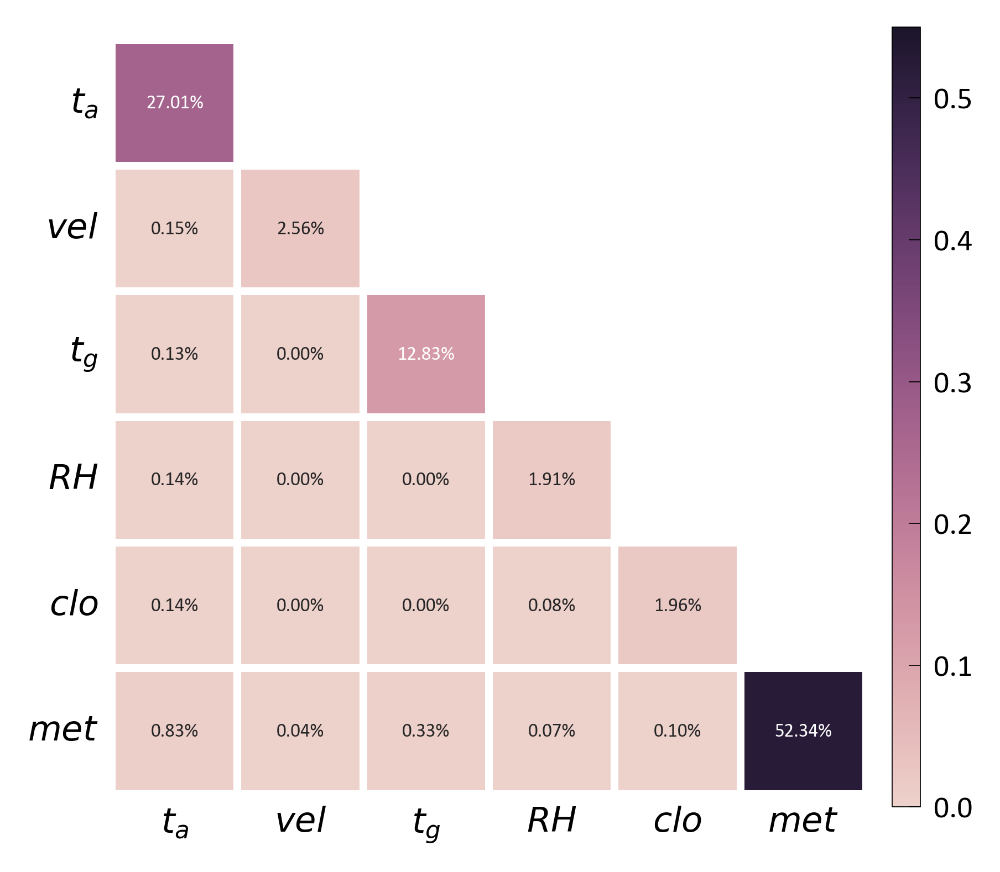

In [14]:
#%% Heatmap lower
# https://matplotlib.org/3.1.1/gallery/images_contours_and_fields/image_annotated_heatmap.html#sphx-glr-gallery-images-contours-and-fields-image-annotated-heatmap-py
# https://seaborn.pydata.org/generated/seaborn.heatmap.html#seaborn.heatmap
# https://seaborn.pydata.org/examples/heatmap_annotation.html
# https://seaborn.pydata.org/examples/many_pairwise_correlations.html


# cubehelix gradient 
# http://davidjohnstone.net/pages/cubehelix-gradient-picker
cmap = sns.cubehelix_palette(n_colors=len(S1)+2, reverse=True,
                             start=0, rot=-4.2, 
                             gamma=0.8, hue=1.1, 
                             light=0.8, dark=0.0)

param_interest = 'PMV'
# load SALib sensitivity analysis dictionary 
SI = np.load(file_path+f'SA_results_{param_interest}.npy', allow_pickle='TRUE').item()

# convert S1 to diagonal element 
diag_element = np.diag(SI['S1'])

# np.triu_indices로 윗삼각행렬의 [i,j] 번호를 반환
# S2가 대각행렬을 포함하지 않기 때문에 -1 갯수  만큼 빼서 만들고 
# [i, j+1] 로 오른쪽으로 1만큼 밀어서 i j 인덱스를 수정  
uptri_index = np.triu_indices(len(SI['S1'])-1)   
uptri_index = (uptri_index[0], uptri_index[1]+1)    

# np.tril_indices로 아래 삼각행렬의 [i,j] 번호를 반환
# S2가 대각행렬을 포함하지 않기 때문에 -1 갯수 만큼 빼서 만들고 
# [i+1, j] 로 아래로 1만큼 밀어서 i j 인덱스를 수정  
lotri_index = np.tril_indices(len(S1)-1)   # 밑삼각행렬의 [i,j] 번호를 반환
lotri_index = (lotri_index[0]+1, lotri_index[1])

# upper diagonal index without diagonal elements from S2 
corr_up_array = SI['S2']


# diagonal index
diag_index = np.diag_indices(len(SI['S1']))
corr_up_array[diag_index] = SI['S1']

# transpose to low triangle matrix 
corr_lo_array = corr_up_array.T

# convert to dataframe 
df_corr_up = pd.DataFrame(corr_up_array, index=S1.index, columns=S1.index)
df_corr_lo = pd.DataFrame(corr_lo_array, index=S1.index, columns=S1.index)


# negative to zero 
df_corr_lo[df_corr_lo<0]=0

# plot correlation 
# elements not to show on heat map
mask = np.zeros_like(df_corr_lo)
mask[uptri_index] = True




nfig_row = 1; nfig_col = 1
# seaborn in subplot
fig, axe = plt.subplots(nfig_row, nfig_col, sharex=False, sharey=False, 
                        figsize=(cm2in(9),cm2in(8)), 
                        facecolor='w', edgecolor='k', squeeze=False)

cmap = sns.cubehelix_palette(as_cmap=True, reverse=False,
                             start=0, rot=0.4, 
                             gamma=1.0, hue=0.8, light=0.85, dark=0.1)

axe = sns.heatmap(df_corr_lo, mask=mask, 
                  annot=True, annot_kws={"size": leg_fs-3}, fmt='.2%',
                  vmin=0, vmax=0.55, #math.ceil(np.max(df_corr_lo).max()*10)/10, 
                  square=True, 
                  linewidths=2.0, linecolor='w', 
                  cbar=False, cmap=cmap,
                  cbar_kws={'orientation': 'vertical', 
                            'label': ' ',
                            'format': '.2%',
                            'shrink': 1.0,
                            'fraction': 0.1})

# subplot_idx = f'(a)'
# axe.annotate(subplot_idx, xy=(0.005, 1.065), xycoords='axes fraction',
#              horizontalalignment='left', verticalalignment='top', fontsize=fs) 


# title 
# axe.set_title(f'Correlation matrix_{file_suffix}', fontsize=fs)

# xlim ylim 
axe.set_xlim(0, len(var_name))
axe.set_ylim(len(var_name), 0.0)


# x,y tick labels
label = ['$'+i+ '$' for i in var_name]   # flip
axe.set_xticklabels(label, fontsize=fs-1)
axe.set_yticklabels(label, fontsize=fs-1)
plt.xticks(fontsize=fs-1)
plt.yticks(rotation=0, fontsize=fs-1)

# remove x,y tick bar
axe.xaxis.set_ticks_position('none') 
axe.yaxis.set_ticks_position('none')   

# label size 
axe.tick_params(labelsize=fs)

# color bar
cbar1 = axe.figure.colorbar(axe.collections[0], 
                            orientation='vertical',
                            pad = 0.03, 
                            aspect = 28,  # colorbar shape 
                            shrink=0.963, fraction=0.11)
                            # shrink=0.963, fraction=0.10)
# cbar1.set_label('Sensitivity index', fontsize=fs)

cbar1.ax.tick_params(labelsize=leg_fs, size=3, width=0.25, direction='in')
cbar1.ax.locator_params(nbins=6)
cbar1.update_ticks()
cbar1.outline.set_visible(True)
cbar1.outline.set_linewidth(0.25)

# convert to percent colorbar ticks 
fig.tight_layout(pad = 0.27)

# save figure
# os.makedirs('../plot/')
my_path ='./plot/'
figname = f'Fig4_Heatmap_Correlation_lower_measured' 
plt.savefig(my_path+figname+'.png', dpi=600)
plt.savefig(my_path+figname+'.svg', dpi=600)
plt.savefig(my_path+figname+'.pdf', dpi=600)
plt.savefig(my_path+figname+'.eps', dpi=600)
        

[ 83.01554674  24.15863829  48.89441209  22.60524531  22.71062205
 144.        ]
Text(1.0, 2.4504569859664533e-08, '$t_a$')
Text(0.49999997764825854, 0.8660254594452442, '$vel$')
Text(-0.5000000372529024, 0.8660253998406003, '$t_g$')
Text(-0.9999999701976781, -6.291820541111046e-08, '$RH$')
Text(-0.4999998882412927, -0.8660254104361045, '$clo$')
Text(0.49999991804361466, -0.8660254104361045, '$met$')
0.9592085273911078
0.9678663709498765
1.007891001749192
1.0401922613285985
1.0350197623024708
0.9960250766713474


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


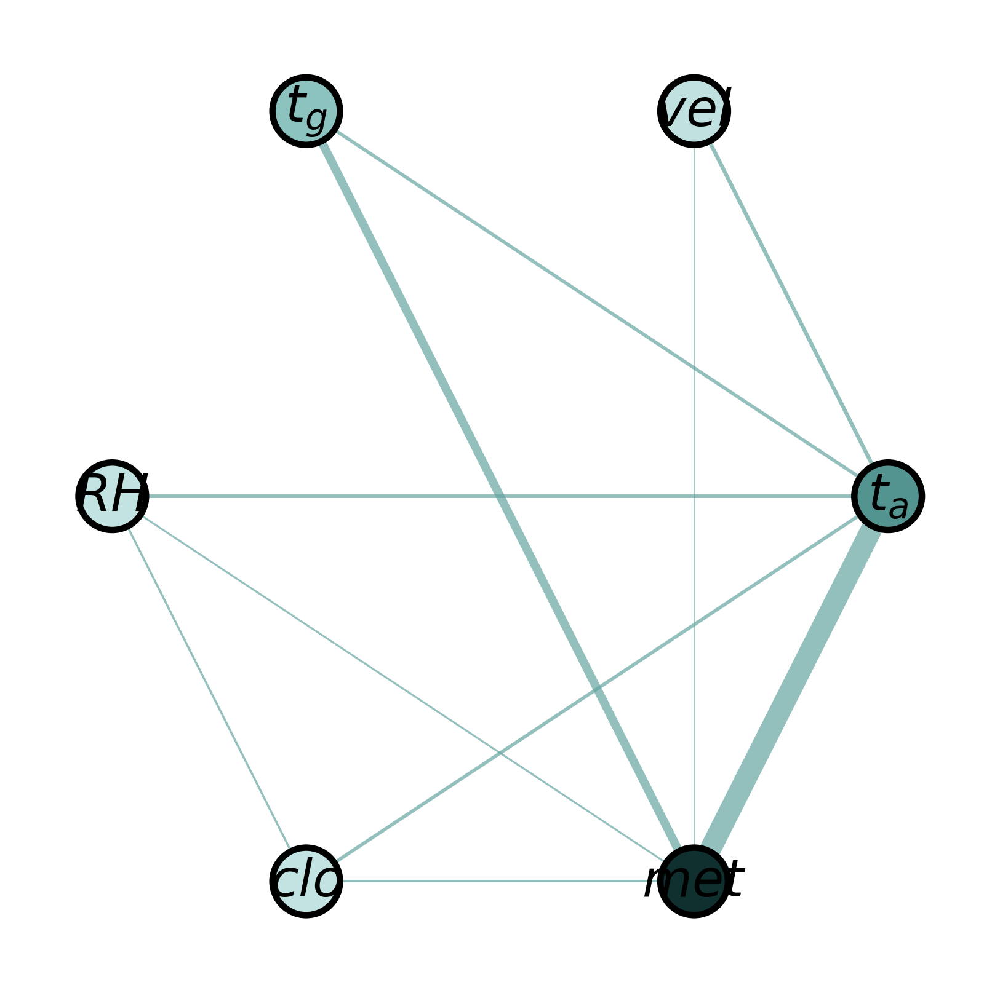

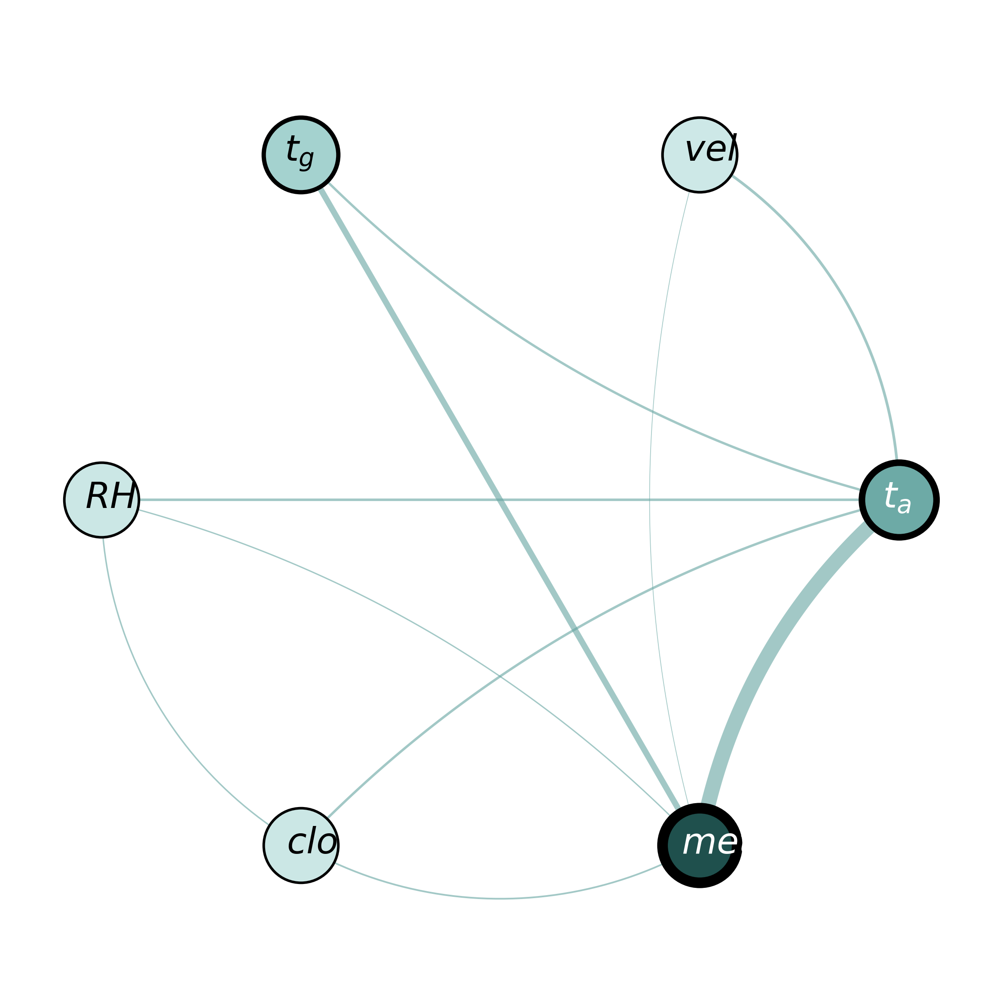

In [15]:
#%% radial convergence plot 
# https://github.com/antonia-had/Radial_convergence_plot

# Function to convert S2 output for graph generation. Taken from 
# https://github.com/Project-Platypus/Rhodium/blob/master/rhodium/sa.py

# load SALib sensitivity analysis dictionary 
SI = np.load(file_path+f'SA_results_{param_interest}.npy', allow_pickle='TRUE').item()

# 세컨오더 센시티비티에 대한 dictionary 만들기 
def S2_to_dict(matrix, problem):
    result = {}
    names = list(problem["names"])
    for i in range(problem["num_vars"]):
        for j in range(i+1, problem["num_vars"]):
            # i번째 변수명이 result에 없으면 i변수명의 키로 빈딕셔너리 생성 
            if names[i] not in result:   
                result[names[i]] = {}   
                
            # j번째 변수명이 result에 없으면 i변수명의 키로 빈딕셔너리 생성 
            if names[j] not in result:
                result[names[j]] = {}
                
            # 변수명 i-j, j-i 를 동시에 Si['S2'] 의 corr 매트릭스 값을 대입함       
            result[names[i]][names[j]] = result[names[j]][names[i]] = float(matrix[i][j])
            
    return result

result = {} #create dictionary to store new

# k : float(v) 형식으로 S1랑 S1_conf를 result 딕셔너리에 저장
result['S1'] = {k : float(v) for k, v in zip(problem["names"], SI["S1"])}
result['S1_conf'] = {k : float(v) for k, v in zip(problem["names"], SI["S1_conf"])}

# S2_to_dict가 S2 매트릭스에 대한 딕셔너리를 반환하므로, 결과는 딕셔너리 안에 또 딕셔너리가 있는 계층구조가 됨
result['S2'] = S2_to_dict(SI['S2'], problem)
result['S2_conf'] = S2_to_dict(SI['S2_conf'], problem)

# k : float(v) 형식으로 ST랑 ST_conf를 result 딕셔너리에 저장
result['ST'] = {k : float(v) for k, v in zip(problem["names"], SI["ST"])}
result['ST_conf'] = {k : float(v) for k, v in zip(problem["names"], SI["ST_conf"])}


SAresults = result # for debug radconv_graph

from radconv_graph import drawgraphs

nfig_row = 1; nfig_col = 1
fig, axe = plt.subplots(nfig_row, nfig_col, sharex=False, sharey=False, 
                        figsize=(cm2in(15),cm2in(15)), 
                        facecolor='w', edgecolor='k', squeeze=True)
drawgraphs(result)


# title 
# axe = plt.gcf().get_axes()
# axe[0].set_title(f'Radial convergence_{file_suffix}', fontsize=fs)

my_path ='./plot/'
figname = 'Fig5_Radial_convergence_plot' 
plt.savefig(my_path+figname+'.png', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.svg', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.eps', dpi=600, transparent=True)



(array([3.3000e+01, 1.7000e+02, 5.9800e+02, 2.0490e+03, 9.4900e+03,
        2.7942e+04, 4.2194e+04, 4.1307e+04, 1.5496e+04, 7.2100e+02]),
 array([-1.59579857, -1.26188542, -0.92797227, -0.59405913, -0.26014598,
         0.07376717,  0.40768032,  0.74159347,  1.07550662,  1.40941977,
         1.74333292]),
 <BarContainer object of 10 artists>)

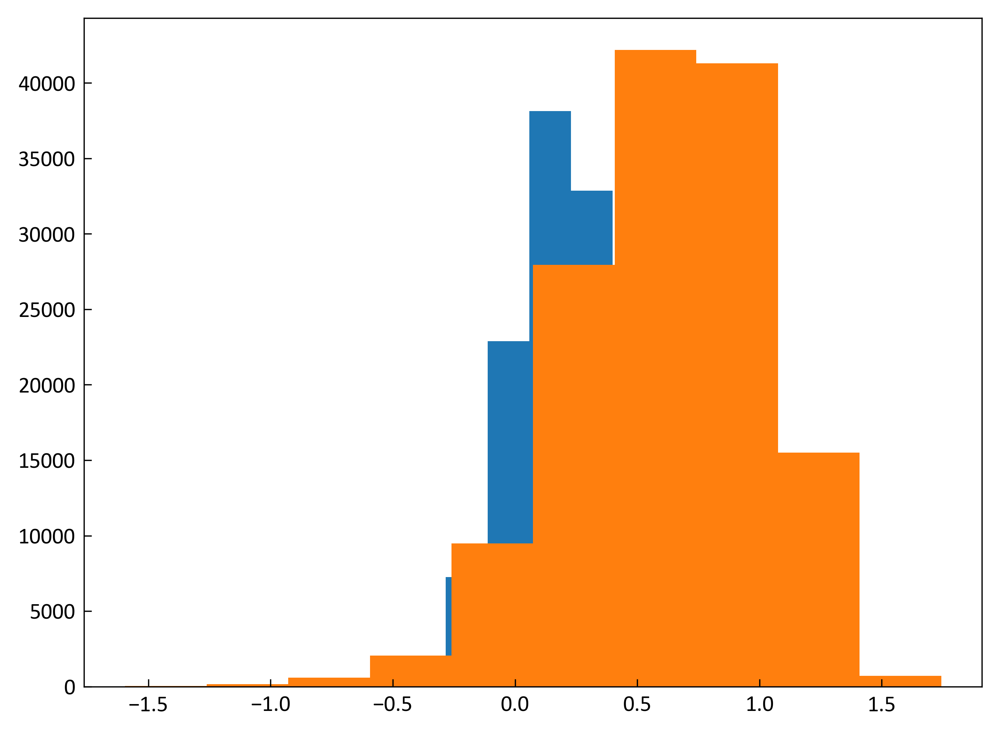

In [16]:
#%% y comparison data load 
# load Y values
file_path = './SA_results/'
file_path2 = './SA_results_fixed/'

# initialize Y list
Rb_default = [0]*len(S1.iloc[0,:])

# dataframe measured PMV
df_PMV_variable = pd.Series(np.load(file_path+f'Y_results_PMV.npy', allow_pickle='TRUE'), name='PMV (measured met)')

# dataframe fixed PMV
df_PMV_fixed =  pd.Series(np.load(file_path2+f'Y_results_PMV_fixed.npy', allow_pickle='TRUE'), name='PMV (fixed met)')
plt.hist(df_PMV_fixed)
plt.hist(df_PMV_variable)   
# df_PMV_variable['tag'] = 'original T_0'
# df_PMV_fixed['tag'] = 'improved T_0'

# df_PMV_variable_tag = pd.DataFrame()
# df_PMV_variable_tag['tag']='origianl T_0'
#   df_PMV_variable = pd.concat([df_PMV_variable, df_PMV_variable_tag], axis=1)  




C:\Users\wonjun\AppData\Local\Temp\ipykernel_33808\648471416.py:70: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_PMV_variable, ax=axe[0, 0],
c:\Users\wonjun\anaconda3\lib\site-packages\seaborn\distributions.py:2511: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)
C:\Users\wonjun\AppData\Local\Temp\ipykernel_33808\648471416.py:78: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot

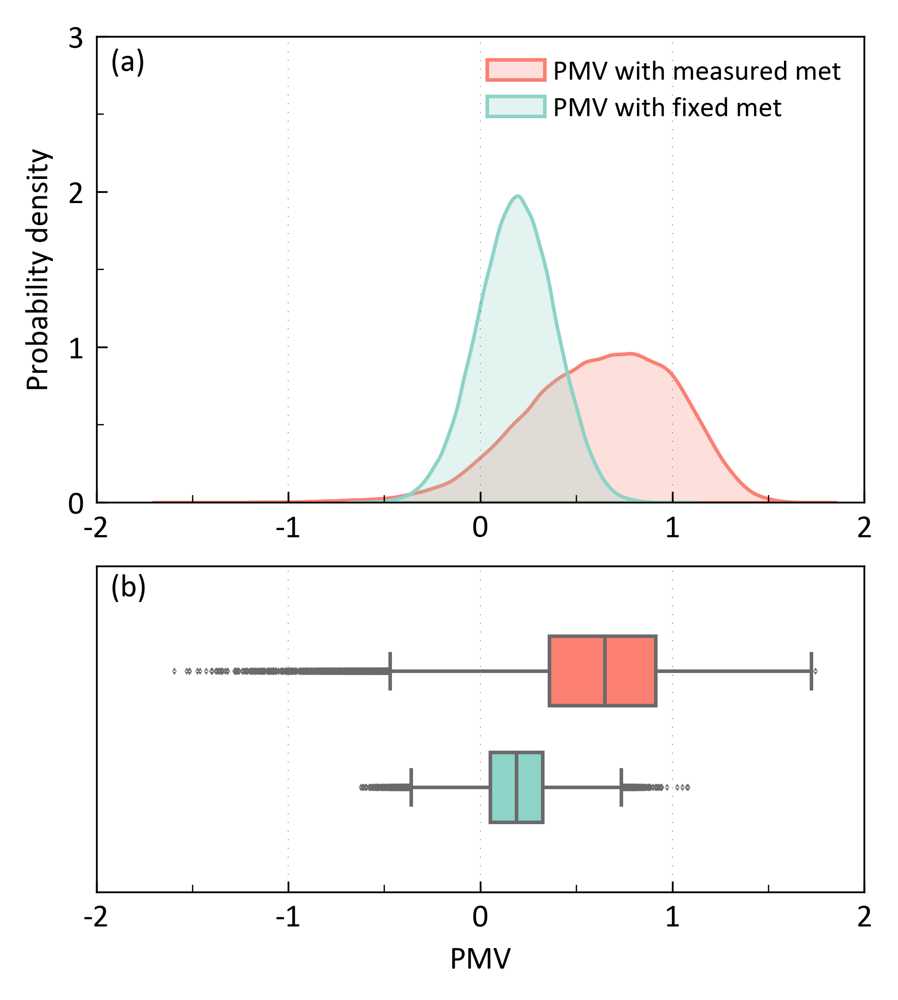

In [17]:
#%% PDF and boxplot

df_PMV_summary = df_PMV_variable.describe()
df_PMV_summary2 = df_PMV_fixed.describe()

# concat two dataframe
y = pd.concat([df_PMV_fixed.rename('PMV (fixed met)'), df_PMV_variable.rename('PMV (variable met)')],
              axis=1, sort=False)


y.describe().unstack()

# 95 CI
y_summary = y.describe()
y_summary = pd.concat([y_summary, y.quantile([.025]), y.quantile([.975])])
CI_95 = y.quantile([.975]).values - y.quantile([.025]).values
y.quantile([.25]).values


y_summary = y_summary.rename(index={0.025:'2.5%', 0.975:'97.5%'})

y.mode



# df1 = pd.concat([df_PMV_variable.loc[:,time], df_PMV_variable.loc[:,'tag']], axis=1, sort=False)
# df2 = pd.concat([df_PMV_fixed.loc[:,time], df_PMV_fixed.loc[:,'tag']], axis=1, sort=False)

# data = pd.concat([df1,df2], axis=0, sort=False)
# data['group'] = 1
# data.rename(columns={3: "R_b"}, inplace=True)


xtick_decimal = ['0','0','0','0','0']
ytick_decimal = ['0','0','1','1','1']
xmin = [-2]*3
xmax = [2]*3
# xint = [(i - j)/7 for i, j in zip(xmax, xmin)]
xint = [1]*3
xmar = [i/4 for i in xint]

ymin = [0, -0.5, 0]
ymax = [3.0, 1.5, 0.5]
yint = [1, 1]
# ymar = [i/4 for i in yint]
ymar = [0.0, 0.4]


xlabel = ['', 'PMV']*2 
ylabel = ['Probability density', '']   # flip

# cubehelix gradient 
# http://davidjohnstone.net/pages/cubehelix-gradient-picker
# cmap = sns.cubehelix_palette(n_colors=len(ST)+2, reverse=True,
#                              start=0, rot=-4.1, 
#                              gamma=0.8, hue=1.2, 
#                              light=0.8, dark=0.0)
cmap = sns.color_palette("Set2")  # 0 6
cmap = sns.color_palette("Set3", 12) # 0 3
# sns.palplot(cmap)
# plot
nfig_row = 2; nfig_col = 1
fig, axe = plt.subplots(nfig_row, nfig_col, sharex=False, sharey=False, 
                        figsize=(cm2in(8.5),cm2in(9.5)), 
                        facecolor='w', edgecolor='k', squeeze=False,
                        gridspec_kw={'height_ratios': [2, 1.4]})

# sns.set_palette("muted")

sns.distplot(df_PMV_variable, ax=axe[0, 0], 
             hist=False, rug=False, kde = True,
                  kde_kws= {'color': cmap[3],
                            "lw": lw[4], 
                            "ls": '-',  
                            'shade': True,
                            "label": 'PMV with measured met'})

sns.distplot(df_PMV_fixed, ax=axe[0, 0], 
              hist=False, rug=False, kde = True,
                  kde_kws= {'color': cmap[0],
                            "lw": lw[4], 
                            "ls": '-',  
                            'shade': True,
                            "label": 'PMV with fixed met'})

# sns.lineplot([0.12,0.12], [-10, 70], ax=axe[0,0],
#              dashes=[1.0, 1.25],
#                 color="red", linewidth=0.75,
#                 label="Reference $R_b$",
#                 plot_kws=dict(alpha=0.3))

# axe[0,0].vlines(0.42020764289239504, -10, 70, 
#                 colors='k', linestyles=':', linewidth=0.75,
#                 label="" )

# axe[1,0].vlines(0.42020764289239504, -10, 70, 
#                 colors='k', linestyles=':', linewidth=0.75,
#                 label="" )

# boxplot 
ax = sns.boxplot(data=y, 
                  orient="h", ax=axe[1,0],
                  palette=[cmap[0], cmap[3]],
                  saturation=1.0,
                  linewidth=lw[4], width=0.60, 
                  whis=1.5,
                  fliersize=0.1)

# axe[1,0].vlines(2.5, -10, 70, 
#                 colors='k', linestyles=':', linewidth=0.75,
#                 label="Reference PMV" )


aa = ax.get_lines()
categories = ax.get_xticks()

# plot decoration
for ridx in range(nfig_row):
    for cidx in range(nfig_col):   
        # figure index 
        idx = nfig_col*ridx + cidx
        
        # zero guide line 
        # axe[ridx, cidx].plot([0,0], [-1,100], c='k', lw=lw[3])    # x=0
        # 
        # x label 
        axe[ridx,cidx].set_xlabel(f'{xlabel[idx]}', fontsize=fs)
        axe[ridx,cidx].set_ylabel(f'{ylabel[idx]}', fontsize=fs)
        
        # tick deecoration 
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='major', width=0.5)
        axe[ridx,cidx].tick_params(direction='in', labelsize=fs, which='minor', width=0.35)
        
        # tick pposition 
        axe[ridx,cidx].set_xticks(np.arange(xmin[idx], xmax[idx]+xint[idx], xint[idx])) 
        axe[ridx,cidx].set_yticks(np.arange(ymin[idx], ymax[idx]+yint[idx], yint[idx])) 
        
        # xlim ylim 
        axe[ridx,cidx].set_xlim(xmin[idx], xmax[idx])
        axe[ridx,cidx].set_ylim(ymin[idx]-ymar[idx], ymax[idx]+ymar[idx])
        # axe[ridx,cidx].margins(x=0, y=0.1)
        
        # tick decimal
        axe[ridx,cidx].xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+xtick_decimal[idx]+'f'))
        
        # number of minor ticks
        axe[ridx,cidx].xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        axe[ridx,cidx].yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        
        # tick off 
        axe[1,cidx].tick_params(axis=u'y', which=u'both',length=0)
        axe[1,cidx].set_yticklabels('')
        
        
        # grid 
#         grid line clipping https://matplotlib.org/users/dflt_style_changes.html#plot
        axe[ridx,cidx].grid(True, axis='x', linestyle='--', linewidth=lw[1], color='0.25');    
        
        # legend 
        handles, labels = axe[ridx,cidx].get_legend_handles_labels()
        legorder1 = range(len(handles))
        axe[ridx,cidx].legend([handles[idx] for idx in legorder1],
                              [labels[idx] for idx in legorder1], 
                              loc='upper right', ncol=1, bbox_to_anchor=None, frameon=False, 
                              edgecolor='None', facecolor='None',
                              fontsize=leg_fs, fancybox=False, 
                              columnspacing= 1.05, labelspacing=0.4)
        
        # subplot annotation, https://matplotlib.org/gallery/text_labels_and_annotations/annotation_demo.html 
        subplot_idx = '('+subplot_no[2*ridx+cidx]+')'
        subplot_idx = f'({subplot_no[idx]})'
        axe[ridx,cidx].annotate(subplot_idx, xy=(.018, 0.975), xycoords='axes fraction',
                                horizontalalignment='left', verticalalignment='top', fontsize=fs) 
        
        # axe[ridx,cidx].set_aspect('auto', adjustable=None, anchor=None, share=False)
       
        # spine line width  
        for k in ['top','bottom','left','right']:
                axe[ridx,cidx].spines[k].set_visible(True)
                axe[ridx,cidx].spines[k].set_linewidth(0.5)
                axe[ridx,cidx].spines[k].set_color('k')  


fig.align_labels()
fig.tight_layout(pad = 0.2)
plt.subplots_adjust(hspace = 0.16, wspace = 0.3)   

my_path ='./plot/'
figname = f'Fig7_PDFs_comparison_c2'
plt.savefig(my_path+figname+'.png', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.svg', dpi=600, transparent=True)
plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)
# plt.savefig(my_path+figname+'.eps', dpi=600)



,$t_a$ [$^{\circ}$C],$vel$ [m/s],$t_g$ [$^{\circ}$C],$RH$ [%],$clo$ [clo],$met$ [met]
count,14000.000000,14000.000000,14000.000000,14000.000000,14000.000000,14000.000000
mean,26.859466,0.500364,26.998900,61.056350,0.600049,1.276537
std,2.071751,0.099890,0.600700,7.122070,0.030000,0.204740
min,14.438826,0.170281,25.021684,50.309334,0.501084,1.011612
25%,26.034662,0.432628,26.595767,57.121890,0.579788,1.089659
50%,27.097282,0.500000,27.000000,59.583214,0.600000,1.233412
75%,28.106779,0.567372,27.404233,62.512977,0.620212,1.443922
max,30.481695,0.829719,28.978316,88.667776,0.698916,1.699493
2.5%,21.964238,0.305444,25.822762,51.776023,0.541633,1.018431
97.5%,30.066467,0.697868,28.167333,83.900687,0.658862,1.674128


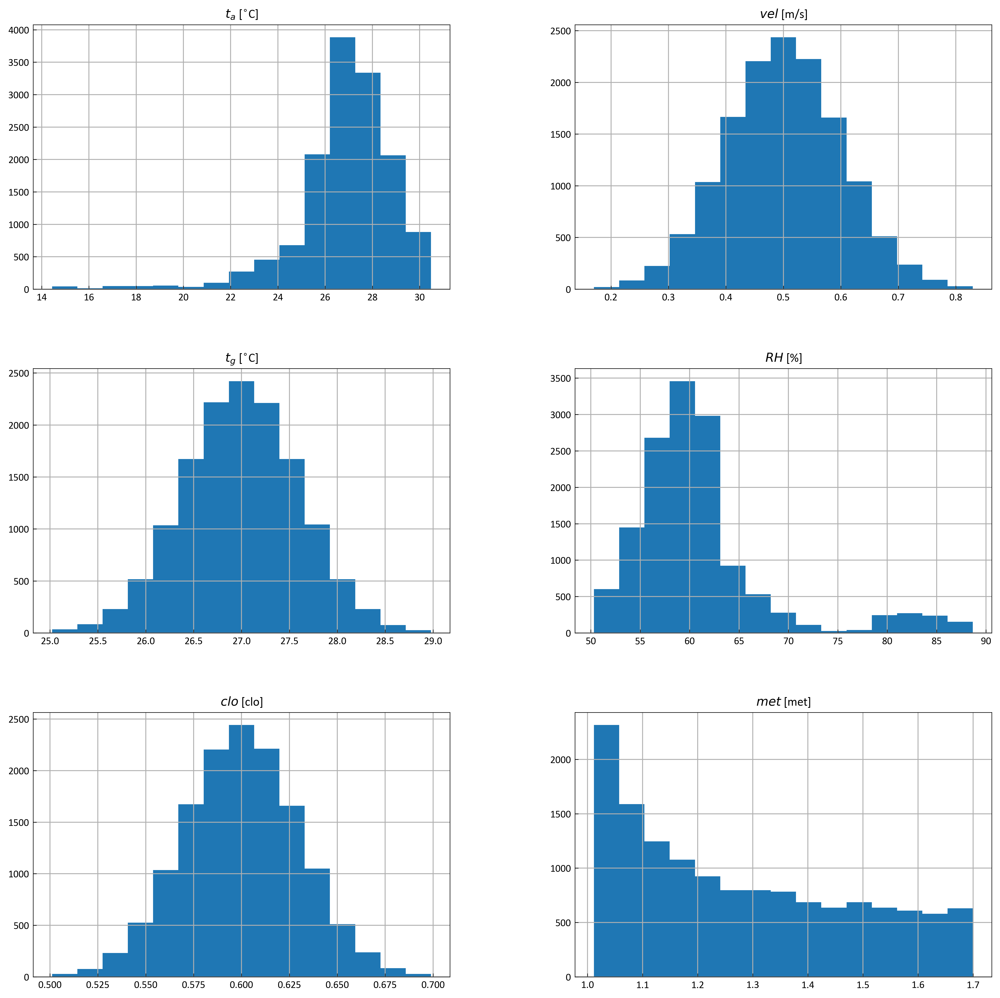

In [18]:
#%% sobol sequence data for pair plot
# number of sample point 
sample_num = 1000

# PMV function
#t_sk = 31;       # skin temperature [C],  정규, 표준편차 0.5도
#t_cl = 31.2;     # mean temperature of the outer surface of the clothed body [C], 정규, 표준편차 0.5도
t_a = 26;        # air temperature [C] 정규, 표준편차 0.5도
# q = 9;          # heat loss from the mannikin [W/m2] 　정규, 표준편차 0.2
a_eff = 0.7;     # effective radiation area factor: the ratio of the effective radiation area of the clothed body to the surface area of the clothed body [-] 
eps = 0.95;    # average emissivity of clothing or body surface [-]
# wg = 75;        # weight [kg], 정규, 표준편차 1.5kg
# he= 180;        # height [m], 정규, 표준편차 0.01 m
vel = 0.5;        # air velocity [m/s], 유니폼 [0,1.5]
t_g = t_a+1;        # globe temperature [C], 정규, 표준편차 0.5도
D = 0.15;       # globe diameter [m], 정규, 표준편차 0.01 m
# Qo2 = 185;      # volumetric rate of oxygen consumption [mL/s], 정규, 표준편차 5
# RQ = 0.9;       # respiratory quotient; molar ratio of CO2 exhaled to O2 inhaled [-], 유니폼 [0.8, 1]
RH = 50;        # relative humidity [%], 정규, 표준편차 3%
clo = 0.6; 	
met = 1.0;


from func_PMV import func_PMV
# data generation 
from SALib.sample import saltelli
from SALib.analyze import sobol
import scipy

# parameter of interest 
param_interest = 'PMV'

var_names = ['t_a', 'vel', 't_g', 'RH', 'clo', 
             'met']

problem = {
    'num_vars': len(var_names),
    'names': ['t_a',  'vel', 't_g', 'RH', 'clo', 
              'met'],
    'bounds': [
        [0, 1],             # 
        [0.5, 0.1],            # 
        [t_g, 0.6],             # 
        [0, 1],          #
        [clo, 0.03],             #
        [0, 1],             # 
        ],          
    'dists': ['unif', 'norm', 'norm', 'unif', 'norm', 
              'unif']
    }


param_values = saltelli.sample(problem, sample_num, calc_second_order=True)


# scipy rv_histogram 
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.rv_histogram.html#scipy.stats.rv_histogram
file_path2 = "./measured_data/"
occu_data = pd.read_csv(file_path2 + 'occup_rawdata.csv', names = ['data'])
occu_data = 1*occu_data + 1.7*(1-occu_data) # conversion to met from occupancy
occu_hist = np.histogram(occu_data['data'], bins=12)
occu_dist = scipy.stats.rv_histogram(occu_hist)
# conversion of original data to defined distribution 
occu_converted_dist = occu_dist.ppf(param_values[:,5])  


rh_data = pd.read_csv(file_path2 + 'rh_rawdata.csv', names = ['data'])
rh_hist = np.histogram(rh_data['data'], bins=12)
rh_dist = scipy.stats.rv_histogram(rh_hist)
# conversion of original data to defined distribution 
rh_converted_dist = rh_dist.ppf(param_values[:,5])  

ta_data = pd.read_csv(file_path2 + 'ta_rawdata.csv', names = ['data'])
ta_hist = np.histogram(ta_data['data'], bins=12)
ta_dist = scipy.stats.rv_histogram(ta_hist)
# conversion of original data to defined distribution 
ta_converted_dist = ta_dist.ppf(param_values[:,5])  

# overwrite samples from converted pdf 
param_values[:,5] = occu_converted_dist 
param_values[:,3] = rh_converted_dist 
param_values[:,0] = ta_converted_dist 

# column labels 
# variable names to call in plots 

variables = ['t_a', 'vel', 't_g', 'RH', 'clo', 
             'met']

var_units = ['[$^{\circ}$C]', '[m/s]', '[$^{\circ}$C]', '[%]', '[clo]',
             '[met]']

labels = ['$' + i + '$' +' '+ j for i, j in zip(variables, var_units)]


# convert to dataframe 
df_params = pd.DataFrame(param_values, columns=labels)


# check the histogram of samples 
df_params.hist(figsize=[15,15], bins=15)

sample_summary = df_params.describe()
sample_summary.loc['2.5%'] = df_params.quantile(0.025)
sample_summary.loc['97.5%'] = df_params.quantile(0.975)
sample_summary.loc['95% CI'] = sample_summary.loc['97.5%'] - sample_summary.loc['2.5%'] 
sample_summary

c:\Users\wonjun\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\misc.py:97: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(


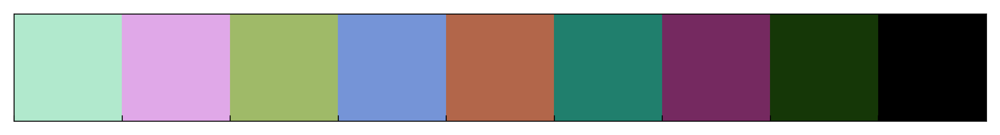

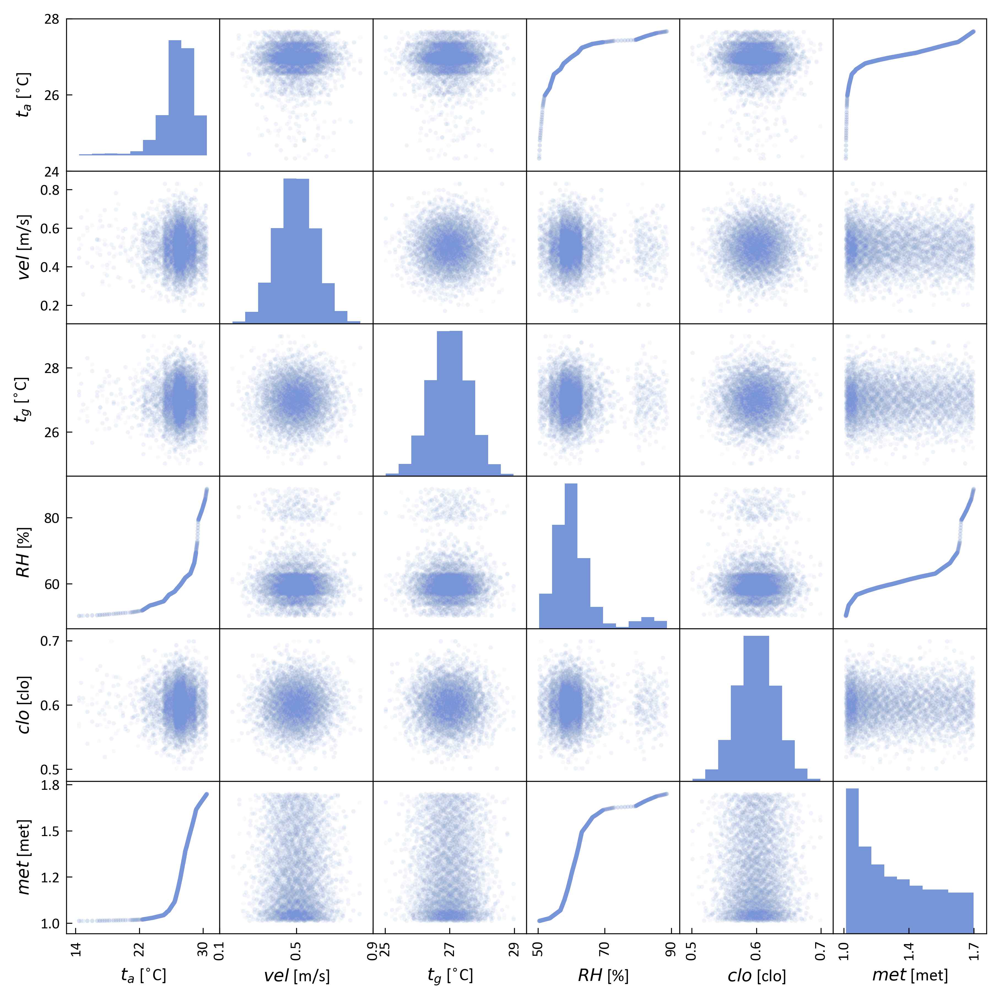

In [19]:
#%% sample scatter pair matrix plots, using pandas  
# cmap = sns.color_palette("Set3", 12)
# sns.palplot(cmap)
cmap = sns.cubehelix_palette(11,as_cmap=False, reverse=False,
                             start=0, rot=4.4, 
                             gamma=1.0, hue=0.8, light=0.85, dark=0.1)
cmap = sns.cubehelix_palette(n_colors=9, reverse=False,
                             start=0, rot=-4.1, 
                             gamma=0.8, hue=1.2, light=0.8, dark=0.0)
sns.palplot(cmap)

xtick_decimal = ['0','1','0','0','1','1']
ytick_decimal = ['0','1','0','0','1','1']

# xmin = [22, 0.6, 0.93, 0.4, 24, 0.13, 45, 0.4, 1.1]
# xmax = [24, 0.8, 0.97, 0.6, 26, 0.17, 55, 0.6, 1.3]
# xint = [1,  0.1, 0.02,  0.1, 1,  0.02, 5,  0.1, 0.1]
xmin = [14, 0.1, 25, 50, 0.5, 1.0]
xmax = [30, 0.9, 29, 90, 0.7, 1.7]
xint = [8,  0.4, 2,  20, 0.1, 0.35]
xmar = [i/3 for i in xint]

xmin = [14, 0.1, 25, 50, 0.5, 1.0]
xmax = [30, 0.9, 29, 90, 0.7, 1.7]
xint = [8,  0.4, 2,  20, 0.1, 0.35]
ymar = [i/3 for i in yint]

xlabel = ['']*7
ylabel = ['']*7   # flip

# pandas 로 그리기 
axe = pd.plotting.scatter_matrix(df_params, alpha=0.02,  #0.02
                                 figsize=[cm2in(18.0),cm2in(18.0)], ax=None, grid=False, 
                                 diagonal='hist', marker='.', s=20, c=cmap[3], 
                                 density_kwds=None, 
                                 hist_kwds={'bins':10, 'color':cmap[3]}, 
                                 range_padding=0.20)
nfig_row = len(var_names) 
nfig_col = len(var_names) 

# plot decoration
# x tick bottom row
for cidx in range(nfig_col):   
    # figure index 
    # idx = nfig_col*ridx + cidx
    
    # x label 
    axe[nfig_row-1,cidx].set_xlabel(f'{labels[cidx]}', fontsize=fs)
    
    # tick decoration 
    axe[nfig_row-1,cidx].tick_params(direction='in', labelsize=fs, which='major', width=0.5)
    axe[nfig_row-1,cidx].tick_params(direction='in', labelsize=fs, which='minor', width=0.35)
    
    # tick position 
    axe[nfig_row-1,cidx].set_xticks(np.arange(xmin[cidx], xmax[cidx]+xint[cidx], xint[cidx])) 
    
    # tick params 
    axe[nfig_row-1,cidx].tick_params(axis='both', which='major', labelsize=fs-1)
    
    # tick decimal
    axe[nfig_row-1,cidx].xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+xtick_decimal[cidx]+'f'))
    # axe[nfig_row-1,cidx].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[idx]+'f'))
    
    # number of minor ticks
    axe[nfig_row-1,cidx].xaxis.set_minor_locator(ticker.AutoMinorLocator(1))
    axe[nfig_row-1,cidx].yaxis.set_minor_locator(ticker.AutoMinorLocator(1))
    
    
# y tick 
for ridx in range(nfig_row):   
    # figure index 
    # idx = nfig_col*ridx + cidx
    
    # y label 
    axe[ridx,0].set_ylabel(f'{labels[ridx]}', fontsize=fs)
    
    # tick decoration 
    axe[ridx,0].tick_params(direction='in', labelsize=fs, which='major', width=0.5)
    axe[ridx,0].tick_params(direction='in', labelsize=fs, which='minor', width=0.35)
    
    # tick params 
    axe[ridx,0].tick_params(axis='both', which='major', labelsize=fs-1)
    
    
    # tick position 
    # if ridx>=1:
    #     axe[ridx,0].set_yticks(np.arange(ymin[ridx], ymax[ridx]+yint[ridx], yint[ridx])) 
    
        # tick decimal
        # axe[ridx,0].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[ridx]+'f'))
     
    axe[ridx,0].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[ridx]+'f'))    
     
    
    # number of minor ticks
    axe[ridx,0].xaxis.set_minor_locator(ticker.AutoMinorLocator(1))
    axe[ridx,0].yaxis.set_minor_locator(ticker.AutoMinorLocator(1))
  
    
  

    
# y tick interval customize 
# retreive from another yaxis and determine the margin percent 
y_min_max = axe[2,0].get_ylim()
y_range = y_min_max[1]-y_min_max[0]
ytick_location_ref = axe[2,0].get_yticks()  # Get the current locations and labels.
y_margin_pct = (y_range-(ytick_location_ref[-1]-ytick_location_ref[0]))/y_range/2

# customize [0,0] yticks 
# https://matplotlib.org/3.1.1/gallery/ticks_and_spines/tick-locators.html
axe[0,0].yaxis.set_major_locator(ticker.LinearLocator(3))
# axe[0,0].yaxis.set_major_locator(ticker.MaxNLocator(3))

ytick_location = axe[0,0].get_yticks()  # Get the current locations and labels.
ytick_initial =  ytick_location[-1]*y_margin_pct
ytick_median = ytick_location[1] 
ytick_last = ytick_location[-1]- ytick_initial

axe[0,0].set_yticks((ytick_initial, ytick_median, ytick_last))  
axe[0,0].set_yticklabels([24, 26, 28])

# axe[8,5].set_xticks(np.arange(0.13,0.18,0.02)) 
# axe[5,0].set_yticks(np.arange(0.13,0.18,0.02)) 


# plot decoration
for ridx in range(nfig_row):
    for cidx in range(nfig_col):   
        # figure index 
        idx = nfig_col*ridx + cidx
        
        # subplot annotation, https://matplotlib.org/gallery/text_labels_and_annotations/annotation_demo.html 
        # subplot_idx = '('+subplot_no[2*ridx+cidx]+')'
        # subplot_idx = f'({subplot_no[idx]})'
        # axe[ridx,cidx].annotate(subplot_idx, xy=(.017, 0.975), xycoords='axes fraction',
        #                         horizontalalignment='left', verticalalignment='top', fontsize=fs) 
        
        # axe[ridx,cidx].set_aspect('auto', adjustable=None, anchor=None, share=False)
       
        # spine line width  
        for k in ['top','bottom','left','right']:
                axe[ridx,cidx].spines[k].set_visible(True)
                axe[ridx,cidx].spines[k].set_linewidth(0.5)
                axe[ridx,cidx].spines[k].set_color('k')  



fig = plt.gcf()
fig.align_labels()
fig.tight_layout(pad = 0.1)
plt.subplots_adjust(hspace = 0.0, wspace = 0.0)   

my_path ='./plot/'
figname = f'Fig8_Scatter_Matrix_pairs_pandas'
# plt.savefig(my_path+figname+'.png', dpi=600, transparent=True)
# plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)



c:\Users\wonjun\anaconda3\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: 

`shade_lowest` has been replaced by `thresh`; setting `thresh=0.05.
This will become an error in seaborn v0.13.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\Users\wonjun\anaconda3\lib\site-packages\seaborn\axisgrid.py:1609: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\Users\wonjun\anaconda3\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: 

`shade_lowest` has been replaced by `thresh`; setting `thresh=0.05.
This will become an error in seaborn v0.13.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\Users\wonjun\anaconda3\lib\site-packages\seaborn\axisgrid.py:1609: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, 

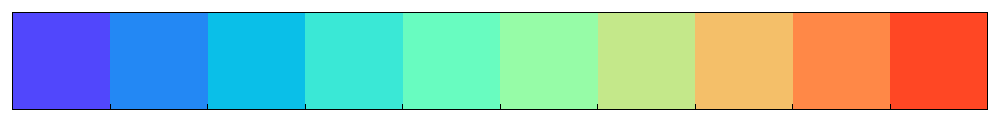

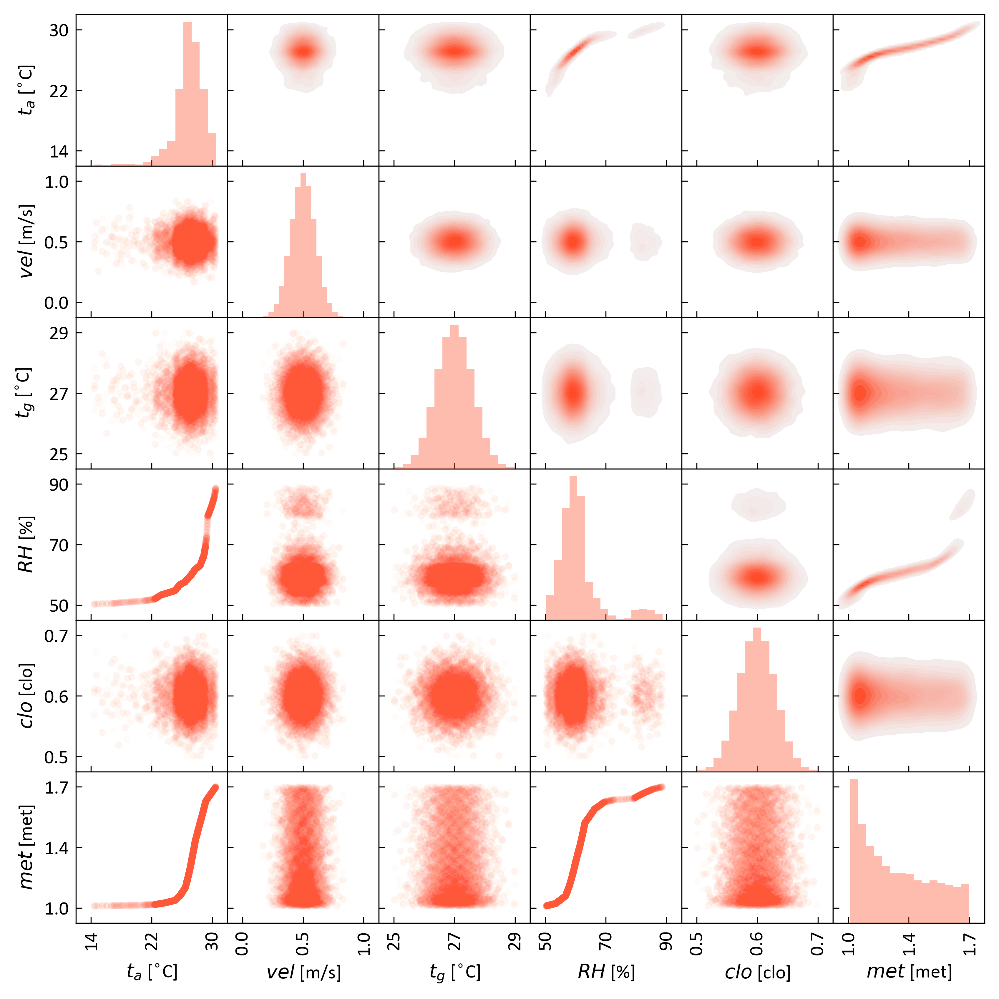

In [20]:
#%% sample scatter pair matrix plots, using seaborn  
variables = ['t_a', 'vel', 't_g', 'RH', 'clo', 
             'met']

var_units = ['[$^{\circ}$C]', '[m/s]', '[$^{\circ}$C]', '[%]', '[clo]',
             '[met]']

labels = ['$' + i + '$' +' '+ j for i, j in zip(variables, var_units)]

fs_adj = 0.5



xtick_decimal = ['0','1','0','0','1','1']
ytick_decimal = ['0','1','0','0','1','1']


# xmin = [14, 0.0, 25, 50, 0.5, 0.0]
# xmax = [30, 1.0, 29, 100, 0.7, 1.0]
# xint = [6,  0.5, 2,  25, 0.1, 0.5]

xmin = [14, 0.0, 25, 50, 0.5, 1.0]
xmax = [30, 1.0, 29, 90, 0.7, 1.7]
xint = [8,  0.5, 2,  20, 0.1, 0.35]
xmar = [i/4 for i in xint]

ymin = xmin
ymax = xmax
yint = xint
ymar = [i/4 for i in yint]


xlabel = labels
ylabel = labels   # flip


# xlabel = ['$k_s$ [W/(m${\cdot}$K)]', '$R_b$ [(m${\cdot}$K)/W]', '$C_s$ [MJ/(m${^3}{\cdot}$K)]', '${\sigma}_{T}$ [$^{\circ}$C]']
# ylabel = ['$k_s$ [W/(m${\cdot}$K)]', '$R_b$ [(m${\cdot}$K)/W]', '$C_s$ [MJ/(m${^3}{\cdot}$K)]', '${\sigma}_{T}$ [$^{\circ}$C]']

# colormap 
# cmap = sns.color_palette("Set2")  # 0 6
# cmap = sns.color_palette("Set3", 12) # 0 3
# cmap2 = plt.get_cmap('Reds')

cmap = sns.color_palette("rainbow", 10) # -1 2
sns.palplot(cmap)
cmap = sns.light_palette(cmap[-1], as_cmap=True)
# cmap = sns.light_palette("Red", as_cmap=True)
cmap_pos = 0.9

# custom cmap 
# cmap_l = c_cmap(lambda x: x+0.08, sns.light_palette("Red", as_cmap=True))
# x, y = np.mgrid[1:2, 1:10:0.01]
# plt.figure(figsize=[15, 1])
# plt.imshow(y, cmap=cmap_l, aspect='auto')
# plt.axis('off'); plt.show();


# grid plot 
g = sns.PairGrid(df_params, diag_sharey=False, height=cm2in(2.8), aspect=1)
g.map_upper(sns.kdeplot, n_levels=20, cmap=cmap, 
            shade=True, shade_lowest=False, gridsize=50)  # colors="C0"
g.map_diag(sns.distplot, bins=15, kde=False, color=cmap(cmap_pos)) #lw=2
g.map_lower(sns.scatterplot, marker='o', color=cmap(cmap_pos), 
            edgecolor="none", s=12, alpha=0.01, rasterized=True)

# access a grid of 'axes' objects
axe = g.axes  
nfig_row = len(axe[:,0])
nfig_col = len(axe[0,:])


# plot decoration
# bottom row
for cidx in range(nfig_col):   
    # x label 
    axe[nfig_row-1,cidx].set_xlabel(f'{xlabel[cidx]}', fontsize=fs+fs_adj)
    
    # tick decoration 
    axe[nfig_row-1,cidx].tick_params(direction='in', labelsize=fs+fs_adj, which='major', width=0.5, length=3)
    axe[nfig_row-1,cidx].tick_params(direction='in', labelsize=fs+fs_adj, which='minor', width=0.25, length=1.5)
    
    # tick position 
    axe[nfig_row-1,cidx].set_xticks(np.arange(xmin[cidx], xmax[cidx]+xint[cidx], xint[cidx])) 
    
    # tick params 
    axe[nfig_row-1,cidx].tick_params(axis='both', which='major', labelsize=fs+fs_adj)
    axe[nfig_row-1,cidx].tick_params(axis='x', rotation=90)
    
    # tick decimal
    axe[nfig_row-1,cidx].xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+xtick_decimal[cidx]+'f'))
    # axe[nfig_row-1,cidx].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[idx]+'f'))
    
    # number of minor ticks
    axe[nfig_row-1,cidx].xaxis.set_minor_locator(ticker.AutoMinorLocator(1))
    axe[nfig_row-1,cidx].yaxis.set_minor_locator(ticker.AutoMinorLocator(1))
    
    # xlim
    axe[nfig_row-1,cidx].set_xlim(xmin[cidx]-xmar[cidx], xmax[cidx]+xmar[cidx])
    

# left end column
for ridx in range(nfig_row):   
    # y label 
    axe[ridx,0].set_ylabel(f'{ylabel[ridx]}', fontsize=fs+fs_adj)
    
    # tick decoration 
    axe[ridx,0].tick_params(direction='in', labelsize=fs+fs_adj, which='major', width=0.5, length=3)
    axe[ridx,0].tick_params(direction='in', labelsize=fs+fs_adj, which='minor', width=0.25, length=1.5)
    
    # tick position 
    axe[ridx,0].set_yticks(np.arange(ymin[ridx], ymax[ridx]+yint[ridx], yint[ridx])) 
    
    # tick params 
    axe[ridx,0].tick_params(axis='both', which='major', labelsize=fs+fs_adj)
    
    # tick decimal
    axe[ridx,0].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[ridx]+'f'))
    # # tick position 
    # if ridx>=1:
    #     axe[ridx,0].set_yticks(np.arange(ymin[ridx], ymax[ridx]+yint[ridx], yint[ridx])) 
    
    #     # tick decimal
    #     axe[ridx,0].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.'+ytick_decimal[ridx]+'f'))
        
    # number of minor ticks
    axe[ridx,0].xaxis.set_minor_locator(ticker.AutoMinorLocator(1))
    axe[ridx,0].yaxis.set_minor_locator(ticker.AutoMinorLocator(1))
    
    # ylim 
    axe[ridx,0].set_ylim(ymin[ridx]-ymar[ridx], ymax[ridx]+ymar[ridx])

# axe[5,0].set_xlim(23.8, 28.2)
# axe[0,0].set_ylim(23.8, 28.2)

# axe[5,2].set_xlim(24.8, 29.2)
# axe[2,0].set_ylim(24.8, 29.2)

# axe[6,0].set_ylim(98.75, 100.25)

# plot decoration
for ridx in range(nfig_row):
    for cidx in range(nfig_col):   
        # figure index 
        idx = nfig_col*ridx + cidx
        # # xlim ylim 
        # axe[ridx,cidx].set_xlim(xmin[idx]-xmar[idx], xmax[idx]+xmar[idx])
        # axe[ridx,cidx].set_ylim(ymin[idx]-ymar[idx], ymax[idx]+ymar[idx])
        
        # subplot annotation, https://matplotlib.org/gallery/text_labels_and_annotations/annotation_demo.html 
        # subplot_idx = '('+subplot_no[2*ridx+cidx]+')'
        # subplot_idx = f'({subplot_no[idx]})'
        # axe[ridx,cidx].annotate(subplot_idx, xy=(.017, 0.975), xycoords='axes fraction',
        #                         horizontalalignment='left', verticalalignment='top', fontsize=fs) 
        
        # axe[ridx,cidx].set_aspect('auto', adjustable=None, anchor=None, share=False)
       
        # spine line width  
        for k in ['top','bottom','left','right']:
                axe[ridx,cidx].spines[k].set_visible(True)
                axe[ridx,cidx].spines[k].set_linewidth(0.5)
                axe[ridx,cidx].spines[k].set_color('k')  

fig = plt.gcf()
fig.align_labels()
fig.tight_layout(pad = 0.1)
plt.subplots_adjust(hspace = 0.00, wspace = 0.00)   

my_path ='./plot/'
figname = f'Fig9_Scatter_Matrix_seaborn'
plt.savefig(my_path+figname+'.png', dpi=600, transparent=False)
plt.savefig(my_path+figname+'.pdf', dpi=600, transparent=True)
